# 삼박자 - 최종 프로젝트

### 코드 진행상황

In [1]:
# 20250109 샘플 데이터셋 전처리 밑작업
# 20250113 전처리 코드 정리 & EDA 시각화 추가
# 20250115 skinsort 브랜드 관련 데이터 추가
# 20250116 아마존 최종 데이터로 전처리 등 코드 수정
# 20250120 중간정리본 1차 정리 완료
# 20250120 선정 브랜드 및 성분 관련 작업 추가 + 코드 진행에 따른 주석 추가
# 20250121 토픽 모델링 코드 추가 + 테스트 진행
# 20250121 추가 코드 및 아웃라인 정리 + 추가 EDA 가능한 부분 주석 작성 + 카테고리별 시각화 제거(이유 : 카테고리별 분류가 큰 의미가 없기 때문)
# 20250121 브랜드별 감성 분석 후 워드클라우드
# 20250122 중간 제출을 위한 코드 및 주석 정리

# PART 1: Data Preprocessing

## Import library & Load data

In [3]:
# 필수 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import datetime
import re
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# 머신러닝 군집분석을 위한 라이브러리 불러오기
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

CWD = os.getcwd()
DATA_PATH = "/Users/jun/GitStudy/Data_4/Data/project5"
os.chdir(DATA_PATH)
print("현재 경로: ", CWD)

def load_data(data_path, file):
    path = os.path.join(data_path, file)
    return pd.read_csv(path)

#item_df = load_data(DATA_PATH,'items_0116.csv' )
#review_df = load_data(DATA_PATH,'reviews_0116.csv')
#skinsort_df = load_data(DATA_PATH,'skinsort_0115.csv')

현재 경로:  /Users/jun/GitStudy/Data_4/Data/project5


In [4]:
os.listdir()

['imfrom_reviews.csv',
 '.DS_Store',
 'imfrom_items.csv',
 'Dr_jart_items.csv',
 'skinsort_0115.csv',
 'amazon_df(ver_1).csv',
 'cosrx_reviews.csv',
 '~$(중간제출용) 3beaty_인디뷰티_아마존전략_v2_0123.pptx',
 'amazon_reviews_df.csv',
 'joseon_reviews.csv',
 '(중간제출용) 3beaty_인디뷰티_아마존전략_v2_0123.pptx',
 'purito_items.csv',
 'results',
 'Dr_jart_reviews.csv',
 'joseon_items.csv',
 'amazon_df(ver_2).csv',
 'cosrx_items.csv',
 'amazon_items_df.csv',
 'purito_reviews.csv']

In [5]:
# 데이터셋 불러오기
dr_items = pd.read_csv('Dr_jart_items.csv')
dr_reviews = pd.read_csv('Dr_jart_reviews.csv')
cs_items = pd.read_csv('cosrx_items.csv')
cs_reviews = pd.read_csv('cosrx_reviews.csv')
if_items = pd.read_csv('imfrom_items.csv')
if_reviews = pd.read_csv('imfrom_reviews.csv')
bj_items = pd.read_csv('joseon_items.csv')
bj_reviews = pd.read_csv('joseon_reviews.csv')
pu_items = pd.read_csv('purito_items.csv')
pu_reviews = pd.read_csv('purito_reviews.csv')
skinsort = pd.read_csv('skinsort_0115.csv')

In [6]:
# 전체적인 데이터 정보 EDA
def eda_overveiw(df):
    
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    
    print(f"\n=================== DATA OVERVIEW ===================")
    
    # 데이터 상단부 확인
    print("\n----------------- Head -----------------")
    print(df.head())
    print("=" * 60)

    # 데이터 정보 및 크기 확인
    print("\n--------------- Information ---------------")
    print(df.info())
    print(f"\nSize: {df.size}")
    print(f"Shape: {df.shape}")
    print("=" * 60)

    # 결측치 확인
    print("\n--------------- Missing Values ---------------")
    print(df.isnull().sum())
    print("=" * 60)

    # 중복값 확인
    print("\n--------------- Duplicate Values ---------------")
    print(df.duplicated().value_counts())
    print("=" * 60)

    # 데이터 기술통계량 확인 (int, float type)
    print("\n------------ Descriptive Statistics (Numeric) ------------")
    print(df.describe())
    print("=" * 60)

    # 데이터 기술통계량 확인 (object type)
    print("\n------------ Descriptive Statistics (Categorical) ------------")
    
    try:
        print(df.describe(include=[object]))
        
    except:  
        object_cols = df.select_dtypes(include=['object']).columns
        error_cols = []
        
        for col in object_cols:
            if df[col].apply(lambda x: isinstance(x, (list, dict))).any():
                error_cols.append(col)
        print(f"{error_cols} Excluded")
        print(df.loc[:, ~df.columns.isin(error_cols)].describe(include=[object]))
    
    print("=" * 60)
    
eda_overveiw(dr_items)


=================== DATA OVERVIEW ===================

----------------- Head -----------------
         ASIN                                              title  order  \
0  B07DR5816K  Dr.Jart+ Cicapair Tiger Grass Color Correcting...      1   
1  B07GTMPYSG  Dr.Jart+ Cicapair Tiger Grass Color Correcting...      1   
2  B081SRDRD7  Dr.Jart+ Cryo Rubber Brightening Face Mask | K...      6   
3  B081SRSNWW  Dr.Jart+ Cryo Rubber Face Mask with Moisturizi...      2   
4  B084Z4W4PK  Dr.Jart+ Dermask Micro Jet Brightening Solutio...     27   

             category     brand  price  global_rating_count  \
0              Makeup  Dr.Jart+   54.0                 3367   
1  Skin Care Products  Dr.Jart+   25.0                 3367   
2  Skin Care Products  Dr.Jart+   16.0                   77   
3  Skin Care Products  Dr.Jart+   16.0                  373   
4  Skin Care Products  Dr.Jart+   10.0                   37   

                                         description  \
0  {"Benefits": "

In [7]:
skinsort.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19050 entries, 0 to 19049
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   brand        19050 non-null  object
 1   name         19050 non-null  object
 2   type         19035 non-null  object
 3   country      17218 non-null  object
 4   ingridients  18731 non-null  object
 5   afterUse     17526 non-null  object
dtypes: object(6)
memory usage: 893.1+ KB


## Data Cleaning

> 데이터 정제하기

### copy original data

In [6]:
# 분석 & 전처리용으로 원본 데이터 복사
dr_items_copy = dr_items.copy()
dr_reviews_copy = dr_reviews.copy()
cs_items_copy = cs_items.copy()
cs_reviews_copy = cs_reviews.copy()
if_items_copy = if_items.copy()
if_reviews_copy = if_reviews.copy()
bj_items_copy = bj_items.copy()
bj_reviews_copy = bj_reviews.copy()
pu_items_copy = pu_items.copy()
pu_reviews_copy = pu_reviews.copy()
skinsort_copy = skinsort.copy()

### data value 대체

In [7]:
# 데이터 전처리
# 'brand'가 없거나 다른 데이터 확인 / 각 파일마다 다르게 정리하기!
# 이유 - 브랜드별 아이템만 추출했기 때문 + 세부사항에 브랜드명 작성되어 있으니 그것보고 판단

# 브랜드 명 변경
brand_list = ['Dr.Jart+', 'COSRX', "I'm from", 'Beauty of Joseon','PURITO']
dr_items_copy['brand'].replace('No brand', brand_list[0], inplace=True)
cs_items_copy['brand'].replace('No brand', brand_list[1], inplace=True)
if_items_copy['brand'].replace('No brand', brand_list[2], inplace=True)
bj_items_copy['brand'].replace('No brand', brand_list[3], inplace=True)
pu_items_copy['brand'].replace('No brand', brand_list[4], inplace=True)

In [8]:
# items_df들의 컬럼 수정을 위해 df를 list에 포함시키기
items_list = [dr_items_copy, cs_items_copy, if_items_copy, bj_items_copy, pu_items_copy]

# reviews_df들의 컬럼 수정을 위해 df를 list에 포함시키기
reviews_list = [dr_reviews_copy, cs_reviews_copy, if_reviews_copy, bj_reviews_copy, pu_reviews_copy]

In [9]:
# items_df들의 결측치를 NaN 값으로 한번에 처리
def preprocess_items(df_items):
    
    df_items['best_sellers_rank_Feature'].replace('No result', np.nan, inplace=True)
    df_items['global_rating_count'].replace('No rating', np.nan, inplace=True)
    df_items['Special_Feature'].replace('No special feature', np.nan, inplace=True)

for i in range(len(items_list)):
    preprocess_items(items_list[i])

In [10]:
# reviews_df들의 결측치를 NaN 값으로 한번에 처리
def preprocess_reviews(df_reviews):
    
    df_reviews['date'].replace('No date', np.nan, inplace=True)
    df_reviews['review_rating'].replace('No review', np.nan, inplace=True)

for i in range(len(reviews_list)):
    preprocess_reviews(reviews_list[i])

### review_df 결측치 제거

In [11]:
# review_df : reivew content 결측치 제거 함수
def dropna_reviews(reviews_df):
    reviews_df.dropna(inplace=True)
    reviews_df.reset_index(inplace=True)

In [12]:
# review data 결측치 제거
for i in range(len(reviews_list)):
    dropna_reviews(reviews_list[i])

### amazon_items_df 생성

In [13]:
# 카테고리별 EDA를 진행하기 위한 아이템 데이터셋 생성
amazon_items_df = pd.concat([dr_items_copy, cs_items_copy, if_items_copy, bj_items_copy, pu_items_copy])

In [14]:
# brand별 아이템 수 확인
amazon_items_df.brand.value_counts()

brand
COSRX               79
I'm from            58
PURITO              52
Dr.Jart+            50
Beauty of Joseon    24
Name: count, dtype: int64

### skinsort 결측치 제거

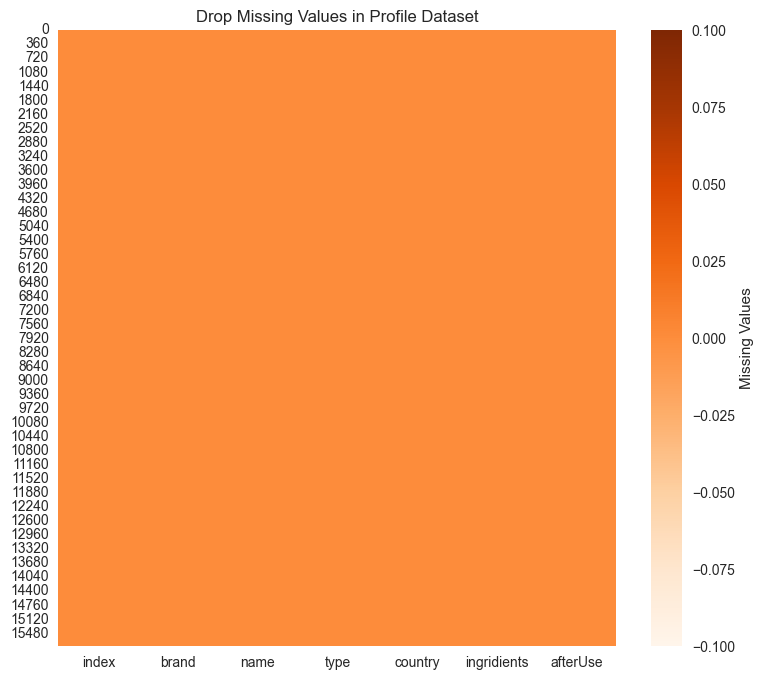

In [15]:
# skinsort 결측치 처리 및 확인
skinsort_copy.dropna(subset=['country','afterUse', 'type'], inplace=True)
skinsort_copy.reset_index(inplace=True)

# skinsort_copy.isnull().sum()

# 결측치 삭제 확인 시각화 -> 모두균일한 색으로 나오면 없는 것 !
plt.close()
plt.figure(figsize=(9,8))
sns.heatmap(skinsort_copy.isnull(), cbar_kws={'label':'Missing Values'}, cmap='Oranges')
plt.title('Drop Missing Values in Profile Dataset')
plt.show()

> 컬럼 별 전처리

In [16]:
# 컬럼 수정 한번에 진행하기!

# df_items : description 컬럼
def preprocess_description(df_items):
    
    for i in range(len(df_items)):
        description = ast.literal_eval(df_items.description[i])
        
        for key, value in description.items():
            if key not in df_items.columns:
                df_items[key] = np.nan
            df_items.loc[i, key] = value
            
    df_items.drop(columns=['description'], inplace=True)

# df_items : detail_dict 컬럼
def preprocess_detail_dict(df_items):
    
    for i in range(len(df_items)):
        detail_dict = ast.literal_eval(df_items.detail_dict[i])
        
        for key, value in detail_dict.items():
            if key not in df_items.columns:
                df_items[key] = np.nan
            df_items.loc[i, key] = value
            
    df_items.drop(columns=['detail_dict'], inplace=True)
    
# df_items : best_sellers_rank_Feature 컬럼을 세부 컬럼으로 나누기
def preprocess_best_sellers_col(df_items):

        for i in range(len(df_items)):
            try:
                value = df_items.best_sellers_rank_Feature[i]
                
                if pd.isna(value): #np.nan 인 애들
                    # print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")
                    continue
                
                if isinstance(value, float): # float 타입인 애들
                    value = str(value)
                    print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")
                
                cat_list = df_items.best_sellers_rank_Feature[i].split('#')
                
                df_items.loc[i, 'Category'] = cat_list[1]
                df_items.loc[i, 'Sub_Category'] = cat_list[2]
                
                detail_list = df_items.Category[i].split('in')
                
                df_items.loc[i, 'Category_Rank']= detail_list[0]
                df_items.loc[i, 'Category_Name']= detail_list[1]
                
                df_items.loc[i, 'Category_Name'] = df_items.Category_Name[i].split('(')[0]
                
                sub_list = df_items.Sub_Category[i].split('in')
                
                df_items.loc[i, 'Sub_Category_Rank']= sub_list[0]
                df_items.loc[i, 'Sub_Category_Name']= sub_list[1]
                    
            except Exception as e:
                print(f"{i}, {df_items.best_sellers_rank_Feature[i]} Passed")
                print(f"Error: {e}")
                
                continue
            
        df_items.drop(columns=['best_sellers_rank_Feature'], inplace=True)

In [17]:
# df_items들의 칼럼 수정 한번에 진행하기!
for i in range(len(items_list)) :
    preprocess_description(items_list[i])
    preprocess_detail_dict(items_list[i])
    preprocess_best_sellers_col(items_list[i])

In [18]:
# df_reviews : date, rating 컬럼
def preprocess_review_cols(df_reviews):

    for i in range(len(df_reviews)):
        
        try:
            
            if pd.isna(df_reviews.date[i]) or 'on' not in df_reviews.date[i]:
                # print(f"{i}, {df_reviews.date[i]} Passed")
                continue
            else:
                df_reviews.loc[i, 'review_date'] = df_reviews.date[i].split('on')[1]
                df_reviews.loc[i, 'review_date'] = pd.to_datetime(df_reviews.review_date[i])
            
            if pd.isna(df_reviews.review_rating[i]):
                print(f"{i}, {df_reviews.review_rating[i]} Passed")
                continue
            else:
                df_reviews.loc[i, 'review_rating'] = float(df_reviews.review_rating[i].split('out')[0])
        except Exception as e:
            print(f"{i}, {df_reviews.review_rating[i]}, Error: {e}")
            continue


In [19]:
# df_items들의 컬럼 한번에 수정하기
# 'review_date'를 날짜 형식으로 변경
# review_rating을 정수형으로 변경
for i in range(len(reviews_list)) :
    preprocess_review_cols(reviews_list[i])
    reviews_list[i]['review_date'] = pd.to_datetime(reviews_list[i]['review_date'])
    reviews_list[i].drop(columns=['date'], inplace=True)
    reviews_list[i]['review_rating'] = pd.to_numeric(reviews_list[i]['review_rating'], errors='coerce', downcast='integer')

### items_list 결측치 제거

여기서 items_list 결측치 처리하기

컬럼을 제거하거나 공통된 컬럼만 살리기

아직은 제거 미실시

In [20]:
# 여기서 items_list의 결측치 처리하기!
# 처리 후 items_list의 df와 reviews_list의 df를 합치기

In [21]:
# # (Description, Suggested use), Item model number, Product Dimensions, Is Discontinued By Manufacturer, UPC, Language - 7
# items_list[0].info()
# # UPC, Item model number, Product Dimensions, Is Discontinued By Manufacturer, Manufacturer recommended age, Date First Available, Batteries, Department, Package Dimensions, Language - 10
# items_list[1].info()
# # UPC, Product Dimensions, Item model number, Product Dimensions, Is Discontinued By Manufacturer, Date First Available, Package Dimensions - 7
# items_list[2].info()
# # UPC, Manufacturer, Item model number, Product Dimensions, Date First Available, Department, Package Dimensions - 7
# items_list[3].info()
# # UPC, Manufacturer, Item model number, Product Dimensions, Is Discontinued By Manufacturer, Package Dimensions, Date First Available
# items_list[4].info()

### Preprocessing

브랜드별 데이터 merge 결합 및 리뷰 데이터 정리 + EDA를 위한 통합 데이터셋으로 concat 결합

Merge 할 때 주의할점!
불필요한 컬럼에 대해서 제거하기!

In [22]:
# 데이터 결합 순서
# 각 브랜드별 item, review 데이터 결합
# Text preprocessing 까지 진행 후 concat으로 최종 결합

In [23]:
# 브랜드별 item, review 데이터 merge 결합
# 여기서 브랜드별 결합 이유 : 모든 데이터를 결합하면 Text preprocessing 시 오류 발생으로 브랜드별 결합 후 최종 concat으로 결합
dr_df = pd.merge(dr_items_copy, dr_reviews_copy, on='ASIN')
cs_df = pd.merge(cs_items_copy, cs_reviews_copy, on='ASIN')
if_df = pd.merge(if_items_copy, if_reviews_copy, on='ASIN')
bj_df = pd.merge(bj_items_copy, bj_reviews_copy, on='ASIN')
pu_df = pd.merge(pu_items_copy, pu_reviews_copy, on='ASIN')

In [24]:
merge_list = [dr_df, cs_df, if_df, bj_df, pu_df]

In [25]:
def preprocess_merge_df(merge_df):

    # 컬럼명 변경, 불필요 컬럼 삭제, 인덱스 수정, 결측치 확인
    merge_df.rename(columns={'content':'review_content', 'title_x':'title'}, inplace=True)
    merge_df.drop(['title_y'], axis=1, inplace=True)
    merge_df.reset_index(drop=True, inplace=True)
    merge_df.isnull().sum()

    # Category_Rank
    merge_df['Category_Rank'] = merge_df['Category_Rank'].apply(
        lambda x: str(x).replace(',', '') if not pd.isna(x) and isinstance(x, float) else x
    ).astype('str').apply(lambda x: x.replace(',', '') if x != 'nan' else None)

    # Sub_Category_Rank
    merge_df['Sub_Category_Rank'] = merge_df['Sub_Category_Rank'].apply(
        lambda x: str(x).replace(',', '') if not pd.isna(x) and isinstance(x, float) else x
    ).astype('str').apply(lambda x: x.replace(',', '') if x != 'nan' else None)

    # review_rating
    merge_df['review_rating'] = merge_df['review_rating'].apply(
        lambda x: str(x) if not pd.isna(x) and isinstance(x, float) else x
    ).astype('float', errors='ignore')

    # review_date
    merge_df['review_date'] = merge_df['review_date'].apply(
        lambda x: pd.to_datetime(x) if not pd.isna(x) else None
    )

    merge_df.reset_index(drop=True, inplace=True)

    merge_df.info()
    merge_df.head(2)
    # amazon_df.to_csv(DATA_PATH + 'amazon_df_0116.csv', encoding='utf-8')

### Text preprocessing

langdetect 간편하게 사용할 수 있어서 선택

Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

In [26]:
# 언어 감지 및 번역을 위한 라이브러리
from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
import swifter
from deep_translator import GoogleTranslator

# 언어 감지
def detect_language(text):
    
    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

# 영어가 아닌 언어를 구글번역을 활용하여 영어로 번역
def translate_en(text):
    
    to_translate = text
    translated = GoogleTranslator(source='auto', target='english').translate(to_translate)
    
    return translated

In [27]:
def text_preprocessing(merge_df) :

    # str 형식이 아닐 경우 오류 방지를 위한 코드
    merge_df['review_content'] = merge_df['review_content'].fillna('').astype(str)

    # 리뷰 언어가 영어가 아닌 경우 -> 번역
    #merge_df['detected_language'] = merge_df['review_content'].apply(detect_language)
    merge_df['detected_language'] = merge_df['review_content'].apply(lambda x: detect_language(x) if isinstance(x, str) else None)


    merge_df.loc[merge_df['detected_language'] != 'en', 'review_content'] = merge_df.loc[merge_df['detected_language'] != 'en', 'review_content'].apply(translate_en)

    # merge_df.to_csv(DATA_PATH + AMAZON / 'amazon_koreaOnly_translated.csv', encoding='utf-8')
    merge_df.rename(columns={'category':'Amazon_Category'}, inplace=True)
    merge_df['review_date'] = merge_df['review_date'].apply(lambda x: pd.to_datetime(x) if not pd.isna(x) else None)
    merge_df['global_rating_count'] = merge_df['global_rating_count'].astype('Int64')
    merge_df['Category_Rank'] = merge_df['Category_Rank'].astype('Int64')
    merge_df['Sub_Category_Rank'] = merge_df['Sub_Category_Rank'].astype('Int64')

    print(merge_df.head(2))

In [28]:
# 브랜드 별 아이템, 리뷰 데이터 merge로 결합 후 리뷰데이터 번역 진행
# 시간이 다소 소요
for i in range(len(merge_list)):
    preprocess_merge_df(merge_list[i])
    text_preprocessing(merge_list[i])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1771 entries, 0 to 1770
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   ASIN                             1771 non-null   object        
 1   title                            1771 non-null   object        
 2   order                            1771 non-null   int64         
 3   category                         1771 non-null   object        
 4   brand                            1771 non-null   object        
 5   price                            1771 non-null   float64       
 6   global_rating_count              1771 non-null   int64         
 7   Special_Feature                  705 non-null    object        
 8   total_star_mean                  1771 non-null   float64       
 9   Benefits                         1771 non-null   object        
 10  Description                      1771 non-null   object     

### Base dataset

In [29]:
# Concat을 활용한 수직결합
# 각 브랜드별 결측치 및 전처리 실시 후 EDA를 하기 위한 수직 결합
# axis = 0, 기본값, 수직
# 기본 코드 concat_df = pd.concat([df1, df2, df3])
amazon_df = pd.concat([dr_df, cs_df, if_df, bj_df, pu_df])

### 추가 Text preprocessing

In [30]:
# nltk 에서 Punkt tokenizer & stopwords list를 다운로드
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt_tab to /Users/jun/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/jun/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [31]:
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
stop_words = set(stopwords.words('english'))  

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
    
        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in stop_words]
    else:
        return tokens

# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

# 저장
amazon_df['cleaned_title'] = amazon_df['title'].apply(clean_text)
amazon_df['cleaned_review'] = amazon_df['review_content'].apply(clean_text)
skinsort_copy['cleaned_ingridients'] = skinsort_copy['ingridients'].apply(clean_text)
skinsort_copy['cleaned_afterUse'] = skinsort_copy['afterUse'].apply(clean_text)

amazon_df['tokenized_title'] = amazon_df['cleaned_title'].apply(tokenize_text)
amazon_df['tokenized_review'] = amazon_df['cleaned_review'].apply(tokenize_text)
skinsort_copy['tokenized_ingridients'] = skinsort_copy['cleaned_ingridients'].apply(tokenize_text)
skinsort_copy['tokenized_afterUse'] = skinsort_copy['cleaned_afterUse'].apply(tokenize_text)

amazon_df['stemmed_title'] = amazon_df['tokenized_title'].apply(stem_tokens)
amazon_df['stemmed_review'] = amazon_df['tokenized_review'].apply(stem_tokens) 
skinsort_copy['stemmed_ingridients'] = skinsort_copy['tokenized_ingridients'].apply(stem_tokens)
skinsort_copy['stemmed_afterUse'] = skinsort_copy['tokenized_afterUse'].apply(stem_tokens)

amazon_df['stpw_processed_title'] = amazon_df['tokenized_title'].apply(remove_stopwords)
amazon_df['stpw_processed_review'] = amazon_df['tokenized_review'].apply(remove_stopwords)
skinsort_copy['stpw_processed_ingridients'] = skinsort_copy['tokenized_ingridients'].apply(remove_stopwords)
skinsort_copy['stpw_processed_afterUse'] = skinsort_copy['tokenized_afterUse'].apply(remove_stopwords)

amazon_df.head(2)

,ASIN,title,order,Amazon_Category,brand,price,global_rating_count,Special_Feature,total_star_mean,Benefits,Description,Suggested use,Manufacturer,Country of Origin,Item model number,Product Dimensions,Is Discontinued By Manufacturer,UPC,Language,Category,Sub_Category,Category_Rank,Category_Name,Sub_Category_Rank,Sub_Category_Name,index,review_num,customer_id,customer_name,review_rating,review_content,review_date,detected_language,Ingredients,Manufacturer recommended age,Date First Available,Batteries,Department,Package Dimensions,is_bundle,cleaned_title,cleaned_review,tokenized_title,tokenized_review,stemmed_title,stemmed_review,stpw_processed_title,stpw_processed_review
0,B07DR5816K,Dr.Jart+ Cicapair Tiger Grass Color Correcting...,1,Makeup,Dr.Jart+,54.0,3367,Redness relief,4.2,"Right after using, 92% said skin looked less r...",A green-to-beige cica cream that instantly neu...,Warm between hands then gently press and blend...,Dr.Jart+,Canada,H59X011000,3.31 x 2.36 x 2.56 inches; 1.7 ounces,No,NaN,NaN,"2,574 in Beauty & Personal Care (See Top 100 i...",14 in CC Facial Creams,2574,Beauty & Personal Care,14,CC Facial Creams,0,B07DR5816K__0,R1AVY9U9QOGEMA,Kelli C,3.0,Not as good as people hype it up to be. I’ll u...,2025-01-18,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,drjart cicapair tiger grass color correcting t...,not as good as people hype it up to be i’ll us...,"[drjart, cicapair, tiger, grass, color, correc...","[not, as, good, as, people, hype, it, up, to, ...","[drjart, cicapair, tiger, grass, color, correc...","[not, as, good, as, peopl, hype, it, up, to, b...","[drjart, cicapair, tiger, grass, color, correc...","[good, people, hype, ’, use, ’, gone, plan, ev..."
1,B07DR5816K,Dr.Jart+ Cicapair Tiger Grass Color Correcting...,1,Makeup,Dr.Jart+,54.0,3367,Redness relief,4.2,"Right after using, 92% said skin looked less r...",A green-to-beige cica cream that instantly neu...,Warm between hands then gently press and blend...,Dr.Jart+,Canada,H59X011000,3.31 x 2.36 x 2.56 inches; 1.7 ounces,No,NaN,NaN,"2,574 in Beauty & Personal Care (See Top 100 i...",14 in CC Facial Creams,2574,Beauty & Personal Care,14,CC Facial Creams,1,B07DR5816K__1,R6EYDZA8D6SJ4,Amazon Customer,3.0,Had to use this for a bit to give it a review....,2025-01-18,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,drjart cicapair tiger grass color correcting t...,had to use this for a bit to give it a review ...,"[drjart, cicapair, tiger, grass, color, correc...","[had, to, use, this, for, a, bit, to, give, it...","[drjart, cicapair, tiger, grass, color, correc...","[had, to, use, thi, for, a, bit, to, give, it,...","[drjart, cicapair, tiger, grass, color, correc...","[use, bit, give, review, moisturizing, sunscre..."


# PART 2: EDA

## ◼ Amazon

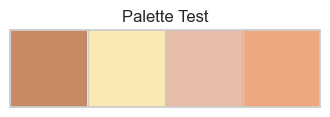

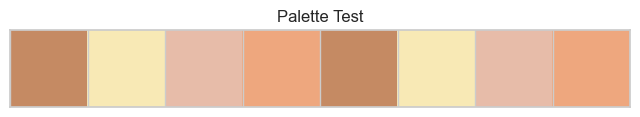

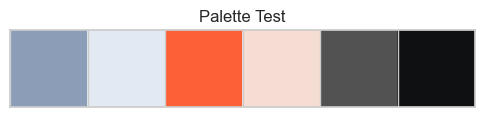

In [32]:
# 팔레트 색상 테스트
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle

beauty_palette = ['#C58A63', '#F8E9B5', '#E7BCA9', '#EEA77E']
market_palette = ["#003f5c", "#214876", "#4e4c8a", "#7e4a93", "#ae448d", "#d63e7a", "#f1465d", "#fd6036"]
market_palette =  [color for color, _ in zip(cycle(beauty_palette), range(len(market_palette)))]

skin_palette = ['#8C9DB7', '#E3E9F2', '#FD6036','#F6DDD3', '#525252', '#0E1012']
custom_cmap = LinearSegmentedColormap.from_list("custom_palette", market_palette)

sns.palplot(beauty_palette)
plt.title("Palette Test")
plt.show()

sns.palplot(market_palette)
plt.title("Palette Test")
plt.show()

sns.palplot(skin_palette)
plt.title("Palette Test")
plt.show()

> 하위 카테고리 확인

In [33]:
# K-beauty 하위 카테고리 별 개수
ak_category_count = pd.DataFrame(amazon_df.Amazon_Category.value_counts())
ak_category_count.reset_index(inplace=True)
ak_category_count.columns = ['Amazon_Category', 'Count']
print(ak_category_count.head())

# K-beauty 아이템 별 개수
category_count = pd.DataFrame(amazon_df.Sub_Category_Name.value_counts())
category_count.reset_index(inplace=True)
category_count.columns = ['Sub_Category', 'Count']
print(category_count.head())

                   Amazon_Category  Count
0               Skin Care Products  11989
1                           Makeup    755
2  Foot, Hand & Nail Care Products     45
3       Beauty Tools & Accessories      8
            Sub_Category  Count
0          Facial Serums   2816
1      Face Moisturizers   2115
2   Facial Toners & Astr   1654
3           Facial Masks   1498
4          Facial Cleans   1242


In [34]:
# K-beauty 브랜드 별 개수
amazon_df.brand.unique()

# 브랜드 별 리뷰 개수
k_brand_count = pd.DataFrame(amazon_df.brand.value_counts())
k_brand_count.reset_index(inplace=True)
k_brand_count

,brand,count
0,COSRX,5189
1,PURITO,2388
2,I'm from,1779
3,Dr.Jart+,1771
4,Beauty of Joseon,1670


### 시각화

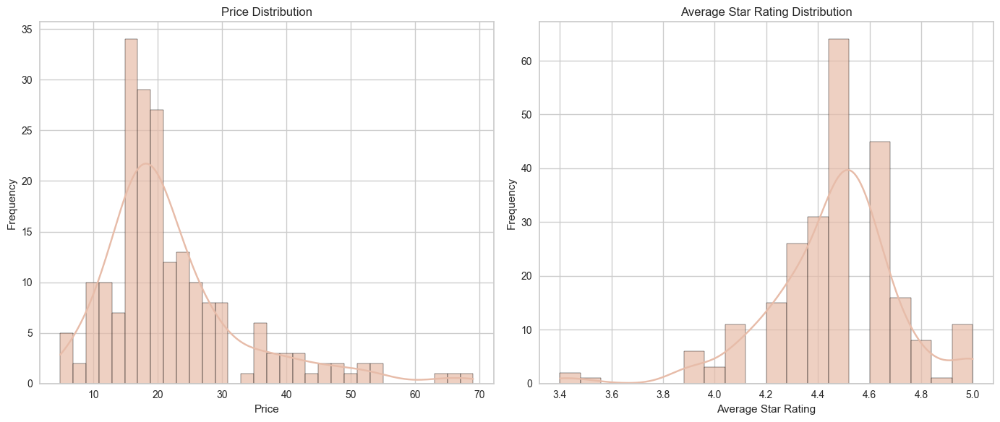

In [35]:
# 가격 분포

# 1. 가격(price) 및 평균 별점(total_star_mean) 분포 분석
plt.figure(figsize=(14, 6))

# 가격 분포
plt.subplot(1, 2, 1)
sns.histplot(amazon_items_df['price'].dropna(), bins=32, kde=True, color='#E7BCA9', alpha=0.7)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')

# 평균 별점 분포
plt.subplot(1, 2, 2)
sns.histplot(amazon_items_df['total_star_mean'], bins=20, kde=True, color='#E7BCA9', alpha=0.7)
plt.title('Average Star Rating Distribution')
plt.xlabel('Average Star Rating')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

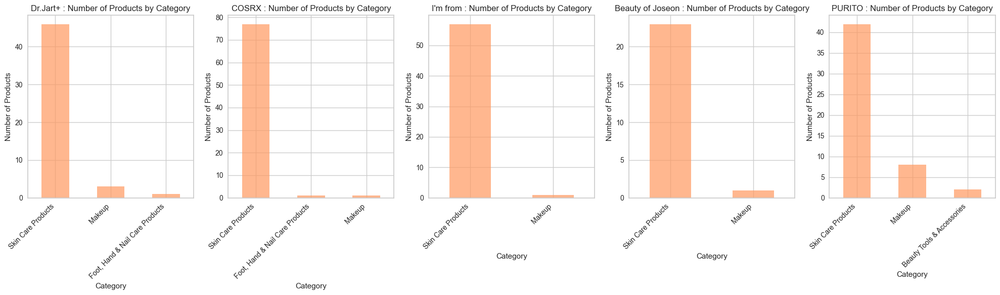

In [36]:
category_dr_counts = amazon_items_df[amazon_items_df['brand']=='Dr.Jart+']
category_cs_counts = amazon_items_df[amazon_items_df['brand']=='COSRX']
category_if_counts = amazon_items_df[amazon_items_df['brand']=="I'm from"]
category_bj_counts = amazon_items_df[amazon_items_df['brand']=='Beauty of Joseon']
category_pu_counts = amazon_items_df[amazon_items_df['brand']=='PURITO']

plt.figure(figsize=(20, 6))

# 브랜드별 제품 수 분포
plt.subplot(1, 5, 1)
category_dr_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('Dr.Jart+ : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 2)
category_cs_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('COSRX : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 3)
category_if_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title("I'm from : Number of Products by Category")
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 4)
category_bj_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('Beauty of Joseon : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.subplot(1, 5, 5)
category_pu_counts['category'].value_counts().plot(kind='bar', alpha=0.7, color='#FF9960')
plt.title('PURITO : Number of Products by Category')
plt.xlabel('Category')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

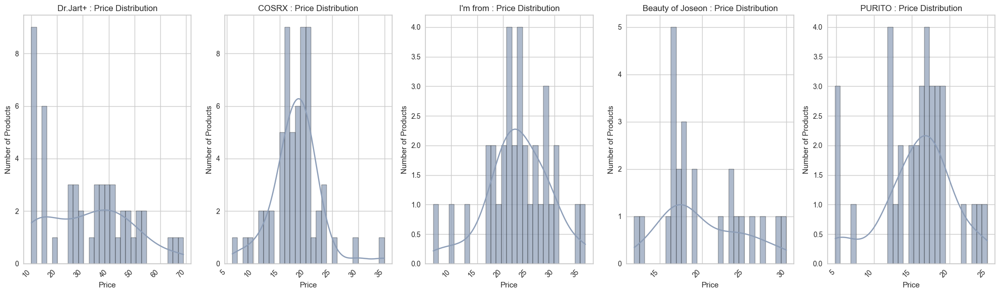

In [37]:
# 브랜드별 가격 분포

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(category_dr_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 2)
sns.histplot(category_cs_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 3)
sns.histplot(category_if_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Price Distribution")
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 4)
sns.histplot(category_bj_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.subplot(1, 5, 5)
sns.histplot(category_pu_counts['price'].dropna(), bins=29, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Products')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

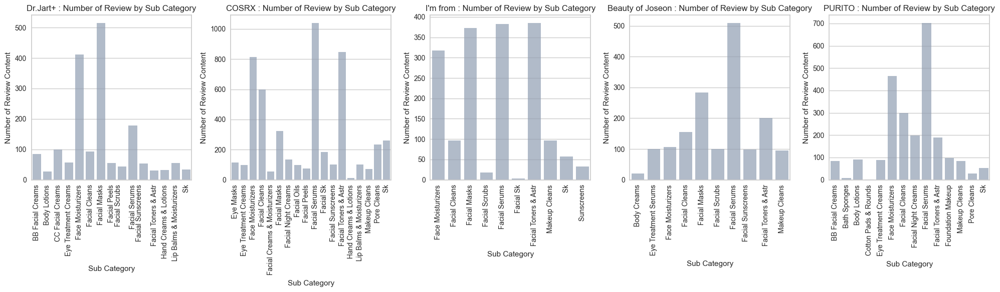

In [38]:
# 브랜드별 서브카테고리별 리뷰수
brand_reviews_cnt = amazon_df.groupby(['brand','Sub_Category_Name'])['review_content'].count().reset_index()

brand_reviews_cnt_dr = brand_reviews_cnt[brand_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_reviews_cnt_cs = brand_reviews_cnt[brand_reviews_cnt['brand']=='COSRX'].reset_index()
brand_reviews_cnt_if = brand_reviews_cnt[brand_reviews_cnt['brand']=="I'm from"].reset_index()
brand_reviews_cnt_bj = brand_reviews_cnt[brand_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_reviews_cnt_pu = brand_reviews_cnt[brand_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.barplot(data=brand_reviews_cnt_dr, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.barplot(data=brand_reviews_cnt_cs, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.barplot(data=brand_reviews_cnt_if, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Number of Review by Sub Category")
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.barplot(data=brand_reviews_cnt_bj, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.barplot(data=brand_reviews_cnt_pu, x='Sub_Category_Name', y='review_content' , alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Number of Review by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

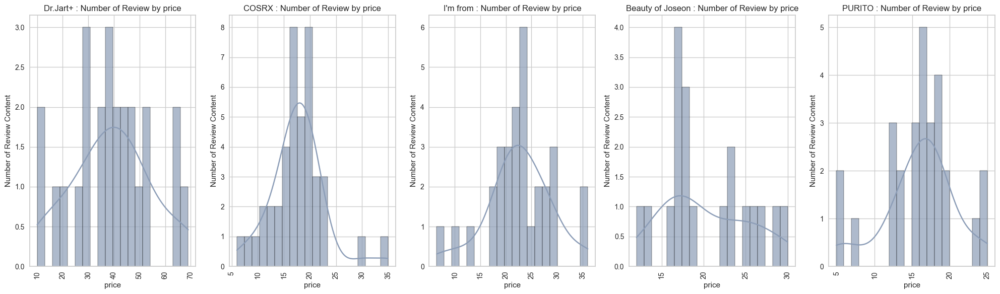

In [39]:
# 브랜드 가격별 리뷰수
brand_price_reviews_cnt = amazon_df.groupby(['brand','price'])['review_content'].count().reset_index()

brand_price_reviews_cnt_dr = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_price_reviews_cnt_cs = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='COSRX'].reset_index()
brand_price_reviews_cnt_if = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=="I'm from"].reset_index()
brand_price_reviews_cnt_bj = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_price_reviews_cnt_pu = brand_price_reviews_cnt[brand_price_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(data=brand_price_reviews_cnt_dr, x='price', bins=20, kde=True ,alpha=0.7, color='#8C9DB7')
plt.title('Dr.Jart+ : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.histplot(data=brand_price_reviews_cnt_cs, x='price', bins=20, kde=True , alpha=0.7, color='#8C9DB7')
plt.title('COSRX : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.histplot(data=brand_price_reviews_cnt_if, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title("I'm from : Number of Review by price")
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.histplot(data=brand_price_reviews_cnt_bj, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title('Beauty of Joseon : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.histplot(data=brand_price_reviews_cnt_pu, x='price', bins=20, kde=True  , alpha=0.7, color='#8C9DB7')
plt.title('PURITO : Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

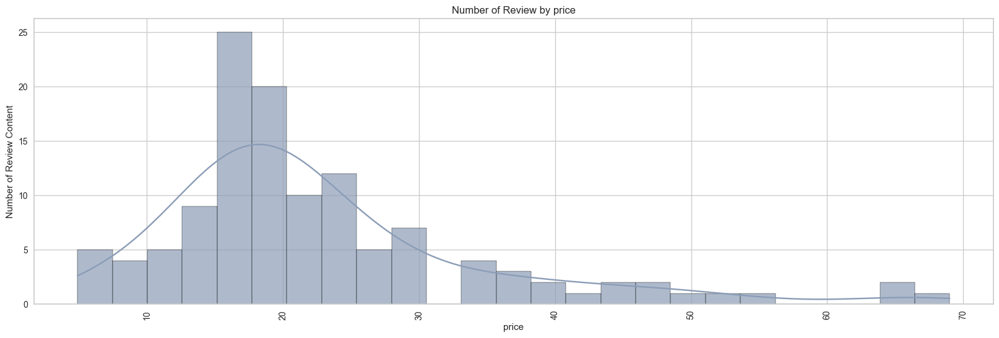

In [40]:
# 전체 가격대별 리뷰수
price_reviews_cnt = amazon_df.groupby(['price'])['review_content'].count().reset_index()


plt.figure(figsize=(20, 6))
sns.histplot(data=price_reviews_cnt, x='price', bins=25, kde=True, alpha=0.7, color='#8C9DB7')
plt.title('Number of Review by price')
plt.xlabel('price')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=90)
plt.show()

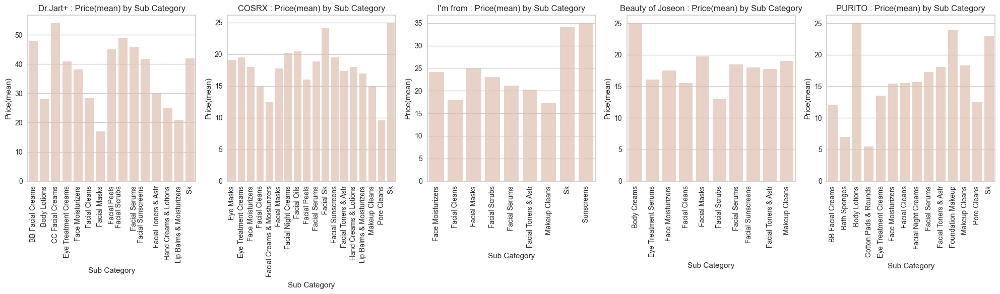

In [41]:
# 브랜드별 서브카테고리별 평균 가격
brand_reviews_mean = amazon_df.groupby(['brand','Sub_Category_Name'])['price'].mean().round(2).dropna().reset_index()

brand_reviews_mean_dr = brand_reviews_mean[brand_reviews_mean['brand']=='Dr.Jart+'].reset_index()
brand_reviews_mean_cs = brand_reviews_mean[brand_reviews_mean['brand']=='COSRX'].reset_index()
brand_reviews_mean_if = brand_reviews_mean[brand_reviews_mean['brand']=="I'm from"].reset_index()
brand_reviews_mean_bj = brand_reviews_mean[brand_reviews_mean['brand']=='Beauty of Joseon'].reset_index()
brand_reviews_mean_pu = brand_reviews_mean[brand_reviews_mean['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.barplot(data=brand_reviews_mean_dr, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('Dr.Jart+ : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 2)
sns.barplot(data=brand_reviews_mean_cs, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('COSRX : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 3)
sns.barplot(data=brand_reviews_mean_if, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title("I'm from : Price(mean) by Sub Category")
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 4)
sns.barplot(data=brand_reviews_mean_bj, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('Beauty of Joseon : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.subplot(1, 5, 5)
sns.barplot(data=brand_reviews_mean_pu, x='Sub_Category_Name', y='price' , alpha=0.7, color='#E7BCA9')
plt.title('PURITO : Price(mean) by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Price(mean)')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

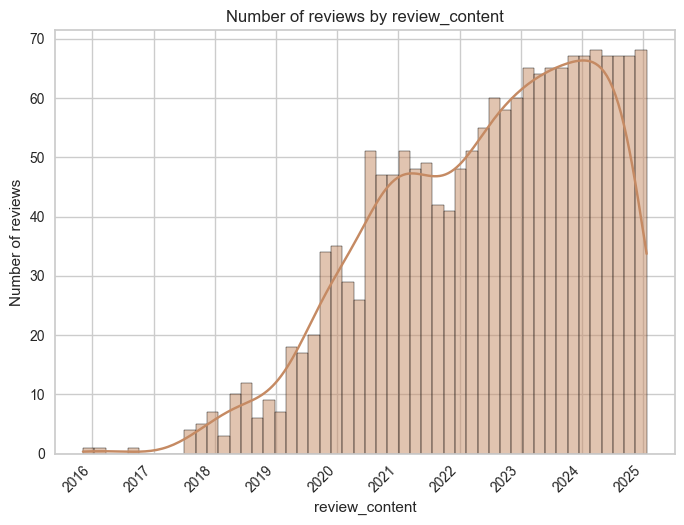

In [42]:
# 기간별 리뷰수
date_reviews_cnt = amazon_df.groupby(['review_date'])['review_content'].count().reset_index()

sns.histplot(data=date_reviews_cnt, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Number of reviews by review_content')
plt.xlabel('review_content')
plt.ylabel('Number of reviews')
plt.xticks(rotation=45, ha='right')
plt.show()

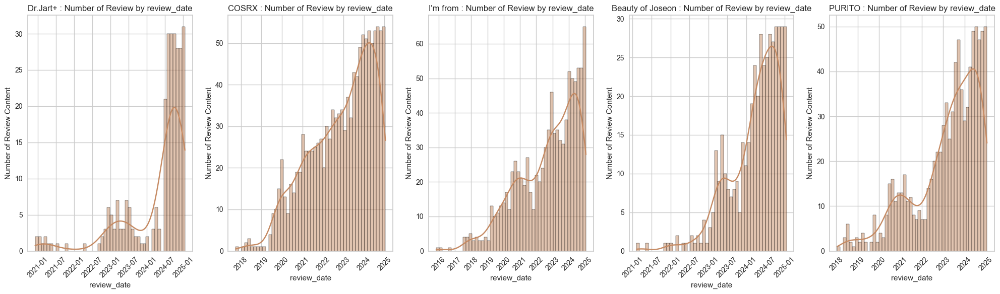

In [43]:
# 브랜드 기간별 리뷰수
brand_date_reviews_cnt = amazon_df.groupby(['brand','review_date'])['review_content'].count().reset_index()

brand_date_reviews_cnt_dr = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='Dr.Jart+'].reset_index()
brand_date_reviews_cnt_cs = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='COSRX'].reset_index()
brand_date_reviews_cnt_if = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=="I'm from"].reset_index()
brand_date_reviews_cnt_bj = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='Beauty of Joseon'].reset_index()
brand_date_reviews_cnt_pu = brand_date_reviews_cnt[brand_date_reviews_cnt['brand']=='PURITO'].reset_index()

plt.figure(figsize=(20, 6))

plt.subplot(1, 5, 1)
sns.histplot(data=brand_date_reviews_cnt_dr, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Dr.Jart+ : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 2)
sns.histplot(data=brand_date_reviews_cnt_cs, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('COSRX : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 3)
sns.histplot(data=brand_date_reviews_cnt_if, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title("I'm from : Number of Review by review_date")
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 4)
sns.histplot(data=brand_date_reviews_cnt_bj, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('Beauty of Joseon : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.subplot(1, 5, 5)
sns.histplot(data=brand_date_reviews_cnt_pu, x='review_date', bins=50, kde=True, color='#C58A63')
plt.title('PURITO : Number of Review by review_date')
plt.xlabel('review_date')
plt.ylabel('Number of Review Content')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_17898/295728497.py:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



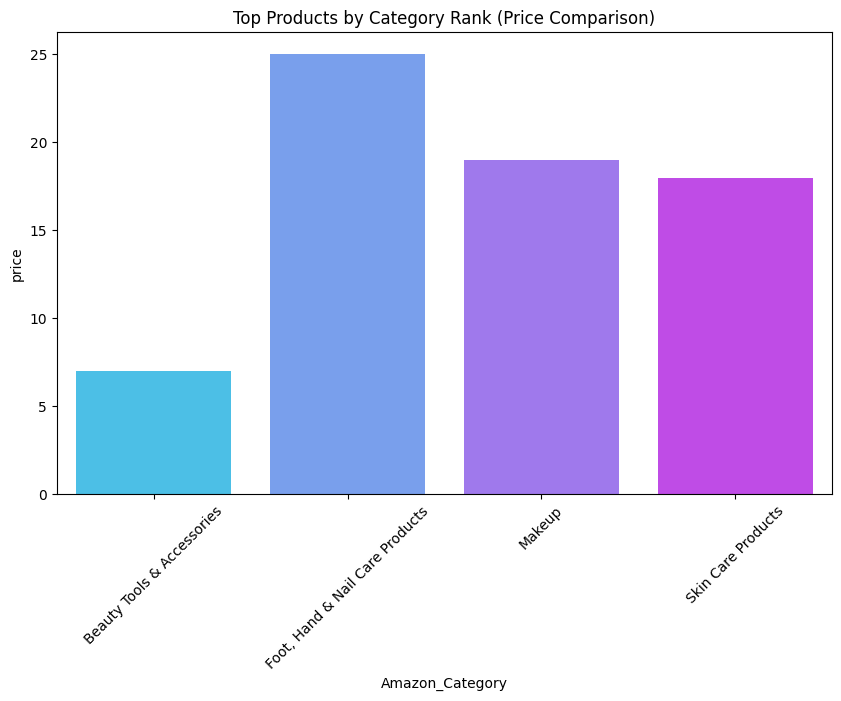

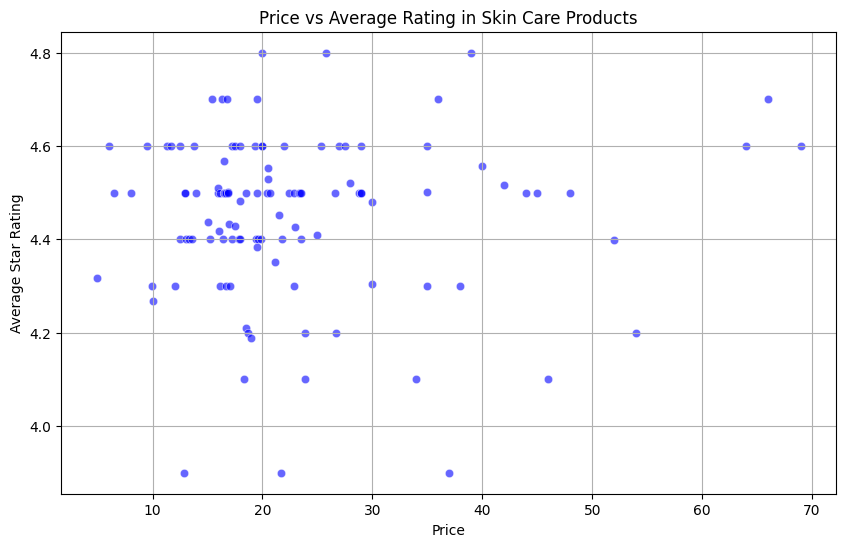

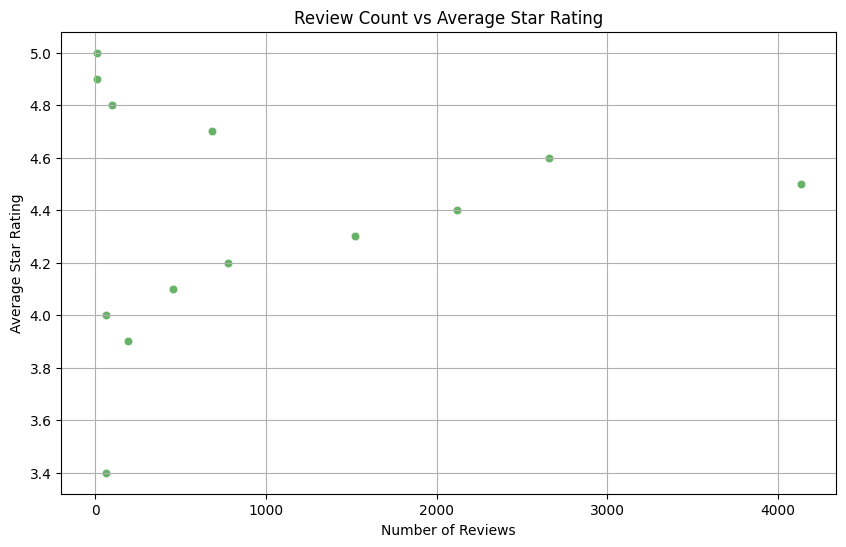

In [101]:
# 1. 제품 성능 심화 분석

## (1) 베스트셀러 탐색: 카테고리별 상위 제품 특성 분석
amazon_df_copy = amazon_df.copy()
category_best = amazon_df_copy.groupby('Amazon_Category').apply(
    lambda x: x.nsmallest(5, 'Category_Rank')
).reset_index(drop=True)

plt.figure(figsize=(10, 6))
sns.barplot(data=category_best, x='Amazon_Category', y='price', ci=None, palette='cool')
plt.title('Top Products by Category Rank (Price Comparison)')
plt.xticks(rotation=45)
plt.show()

## (2) 가격 민감도 분석: 동일 카테고리 내 가격 대비 평점
selected_category = 'Skin Care Products'
category_data = amazon_df_copy.groupby(['Amazon_Category','price'])['total_star_mean'].mean().reset_index()
category_data_coef = category_data[category_data['Amazon_Category'] == selected_category]

plt.figure(figsize=(10, 6))
sns.scatterplot(data=category_data_coef, x='price', y='total_star_mean', alpha=0.6, color='blue')
plt.title(f'Price vs Average Rating in {selected_category}')
plt.xlabel('Price')
plt.ylabel('Average Star Rating')
plt.grid(True)
plt.show()

## (3) 리뷰 개수와 평점 간 상관관계 분석
amazon_df_copy_coef = amazon_df_copy.groupby('total_star_mean')['review_content'].count().reset_index()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=amazon_df_copy_coef, x='review_content', y='total_star_mean', alpha=0.6, color='green')
plt.title('Review Count vs Average Star Rating')
plt.xlabel('Number of Reviews')
plt.ylabel('Average Star Rating')
plt.grid(True)
plt.show()

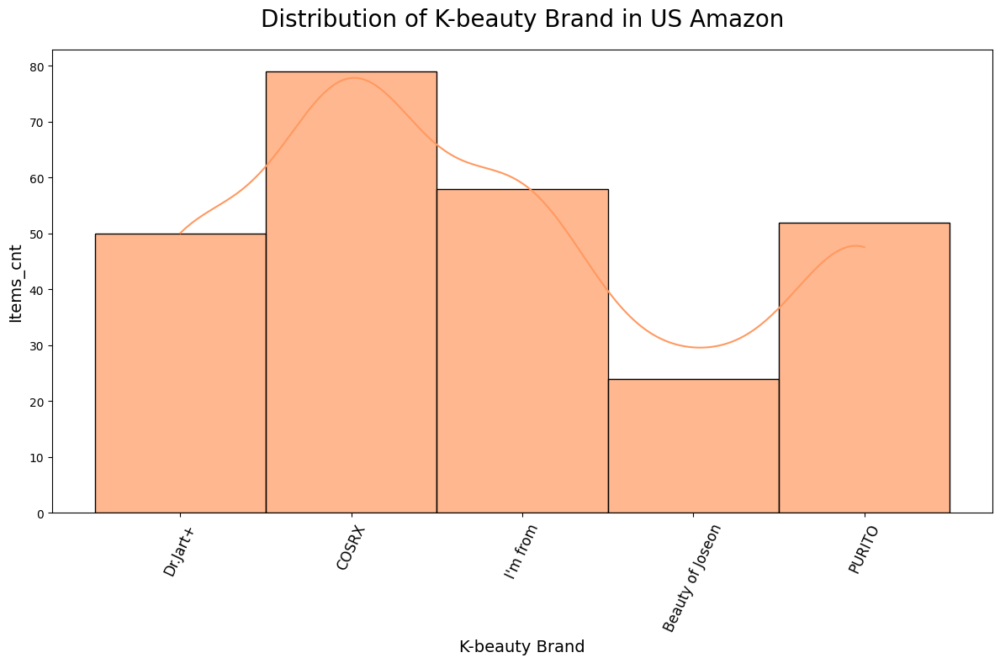

In [102]:
# 브랜드 분포
plt.figure(figsize=(12,8))
sns.histplot(data=amazon_items_df['brand'], bins=5, alpha=0.7, color='#FF9960', kde=True)
plt.title('Distribution of K-beauty Brand in US Amazon', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('K-beauty Brand', fontsize=14)
plt.ylabel('Items_cnt', fontsize=14)

plt.tight_layout()
plt.show()

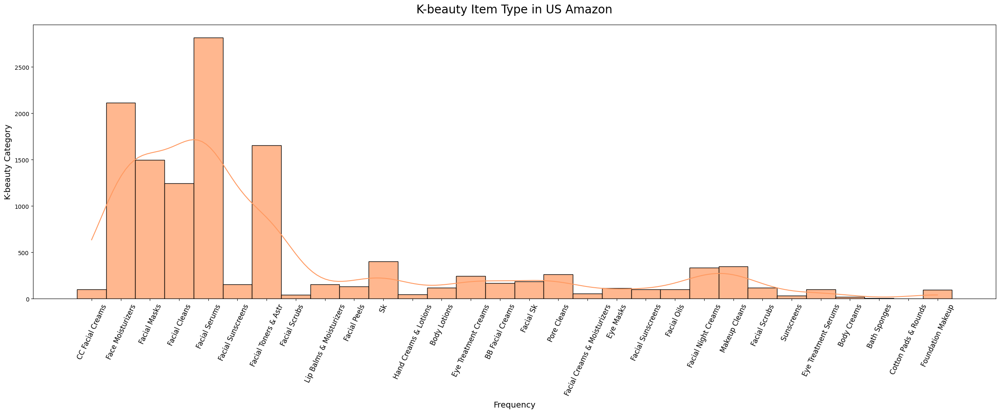

In [103]:
# 제품 유형 분포
plt.figure(figsize=(24,10))
sns.histplot(data=amazon_df['Sub_Category_Name'], bins=31, alpha=0.7, color='#FF9960', kde=True)
plt.title('K-beauty Item Type in US Amazon', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('K-beauty Category', fontsize=14)

plt.tight_layout()
plt.show()

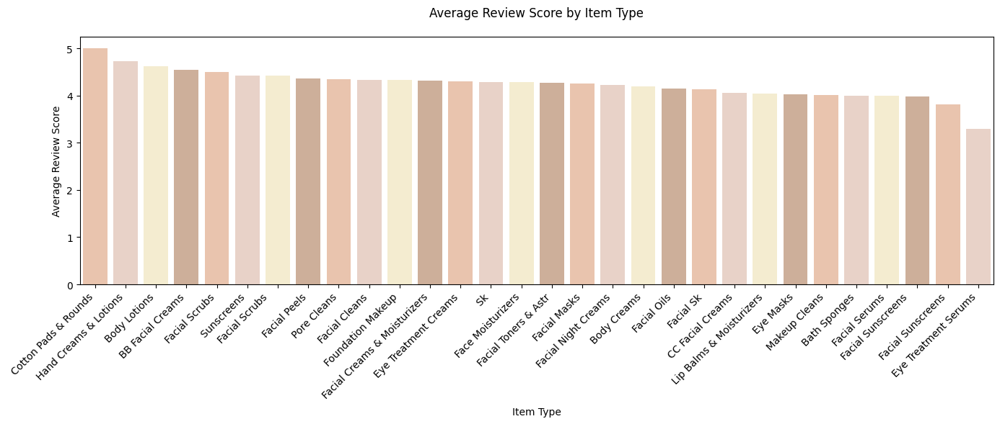

In [104]:
# <제품 유형, 브랜드 별 <-> 리뷰 평점 확인>
# 1. 제품 유형 별 평균 리뷰 평점
category_mean = pd.pivot_table(amazon_df, index=['Sub_Category_Name'], values='review_rating',aggfunc='mean')
category_mean = category_mean.reset_index().sort_values(by='review_rating', ascending=False)
category_mean.head(2)

plt.figure(figsize=(14, 6))
sns.barplot(data=category_mean, x='Sub_Category_Name', y='review_rating', dodge=False, palette=market_palette[-1::-1], alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Average Review Score by Item Type', pad=20)
plt.ylabel('Average Review Score')
plt.xlabel('Item Type')
plt.tight_layout()
plt.show()

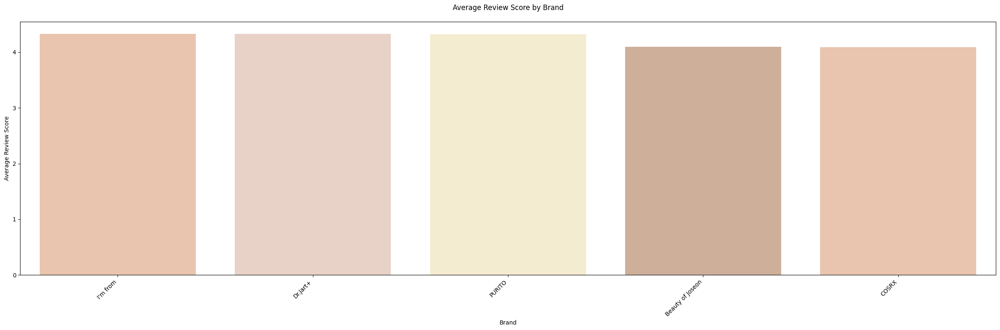

In [105]:
# 2. 브랜드별 평균 리뷰 평점
filtered_df = amazon_df[['brand', 'review_rating']].copy()

filtered_df['review_rating'] = pd.to_numeric(filtered_df['review_rating'], errors='coerce')
filtered_df.dropna(subset=['brand', 'review_rating'], inplace=True)

brand_review_score = pd.pivot_table(
    filtered_df,
    index=['brand'],
    values='review_rating',
    aggfunc='mean'
)
brand_review_score = brand_review_score.reset_index().sort_values(by='review_rating', ascending=False)
brand_review_score.reset_index(inplace=True, drop=True)
brand_review_score[:20]

brand_review_score.head(2)

plt.figure(figsize=(24, 8))
sns.barplot(data=brand_review_score, x='brand', y='review_rating', dodge=False, palette=market_palette[-1::-1], alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.title('Average Review Score by Brand', pad=20)
plt.ylabel('Average Review Score')
plt.xlabel('Brand')
plt.tight_layout()
plt.show()

In [106]:
# 브랜드별 가격, 제품 유형별 가격, 가격별 평균 평점 추가적으로 확인해보기

In [107]:
# 브랜드별 평균 평점 시각화
import plotly.graph_objects as go

df = brand_review_score

fig = go.Figure(data=[go.Table(
    header=dict(values=df.columns, fill_color='paleturquoise', align='center'),
    cells=dict(values=[df[col] for col in df.columns], fill_color='lavender', align='center'))
])

fig.update_layout(title='Brand Review Scores')
fig.show()

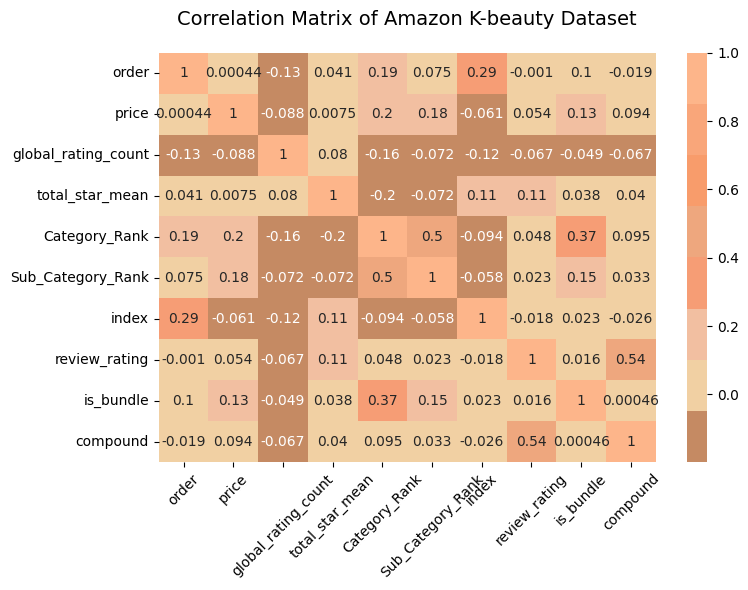

In [108]:
# 전반적인 상관관계
ordinal_palette = [
    '#C58A63', 
    '#F1D0A3', 
    '#F2BFA1',  
    '#F69D75',  
    '#EEA77E',  
    '#F89C6B',  
    '#F9A67A',  
    '#FDB58A'
]

plt.close()

sns.reset_defaults()
plt.rcdefaults()
plt.style.use('default')
plt.figure(figsize=(8,6))

sample_data = amazon_df.select_dtypes(include=["number"])

#compute correlation
corr_matrix = sample_data.corr()
corr_matrix

#annot=True return the correlation values
sns.heatmap(corr_matrix, cmap=ordinal_palette, annot=True)
plt.xticks(rotation=45)
plt.title('Correlation Matrix of Amazon K-beauty Dataset', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

### 워드클라우드

In [109]:
from src.util.repo_paths import AMAZON
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
import string
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
# NLTK 기본 영어 불용어 세트
stop_words = set(stopwords.words('english'))
# K-beauty 관련 추가 불용어
kbeauty_stopwords = {
    "kbeauty", "beauty", "skincare", "cosmetics", "product", "products","use", "using",
    "skin", "care", "makeup", "cream", "serum", "mask", "sheet", "toner", "cleanser",
    "best", "top", "favorite", "amazing", "perfect", "affordable",
    "good", "bad", "great", "recommend", "use", "review", "love","brand", "brands", "item", "items", "category", "categories", "line", "lines","formula", "formulas", "ingredient", "ingredients", "collection", "collections",
"set", "sets", "value", "values", "pack", "packs","new", "latest", "exclusive", "limited", "special", "natural", "organic","premium", "luxury", "high-end", "affordable", "cheap", "popular", "trending","quality", "safe", "effective", "innovation", "innovative",
"worked", "works", "doesn't", "didn't", "okay", "fine", "worth", "worthless","amazing", "awesome", "perfect", "nice", "okay", "awful", "terrible", "horrible","face", "feel","really","stuff","skin","used","time", "dont","makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never","bought", "cosrx","always","less",
"time","without","absolutely","might","maybe","sure","think","though", "getting","want","result","know", "especially","dr jart","feel","didnt","dosent","purchase","definitely","bottle","im","thing","wash","smell","started","need","fragrance","mask","type","facial","another","noticed","actually", "people","money","got","box","every","another","found","jart","wear"
}

# 기존 stop_words와 K-beauty 불용어 합치기
custom_stopwords = stop_words.union(kbeauty_stopwords)
# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
        # 소문자로 모두 변환
        text = text.lower()
        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)
        # @ 제거
        text = re.sub(r'@\w+', '', text)
        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))
        return text
    else:
        return text
# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text
# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in custom_stopwords]
    else:
        return tokens
# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

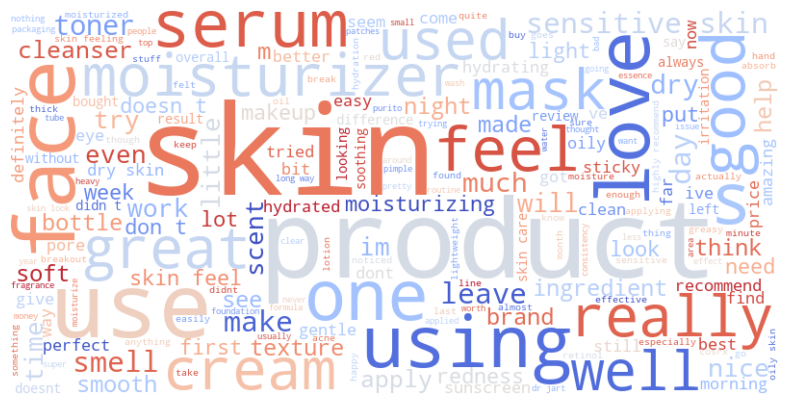

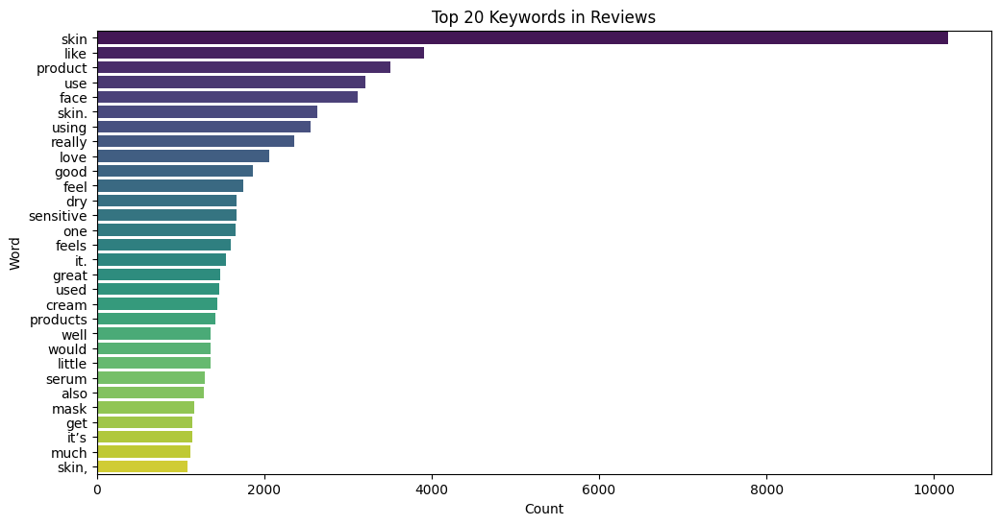

In [110]:
from wordcloud import WordCloud
from collections import Counter 

# 전처리된 아마존 모든 리뷰 워드 클라우드
wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(amazon_df['cleaned_review'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

amazon_df_copy = amazon_df.copy()

review_text = " ".join(review for review in amazon_df_copy['review_content'].dropna())

words = [word for word in review_text.split() if word.lower() not in stop_words]
common_words = Counter(words).most_common(30)

# 막대그래프로 표시
common_words_df = pd.DataFrame(common_words, columns=['Word', 'Count'])
plt.figure(figsize=(12, 6))
sns.barplot(data=common_words_df, x='Count', y='Word', palette='viridis')
plt.title('Top 20 Keywords in Reviews')
plt.xlabel('Count')
plt.ylabel('Word')
plt.show()

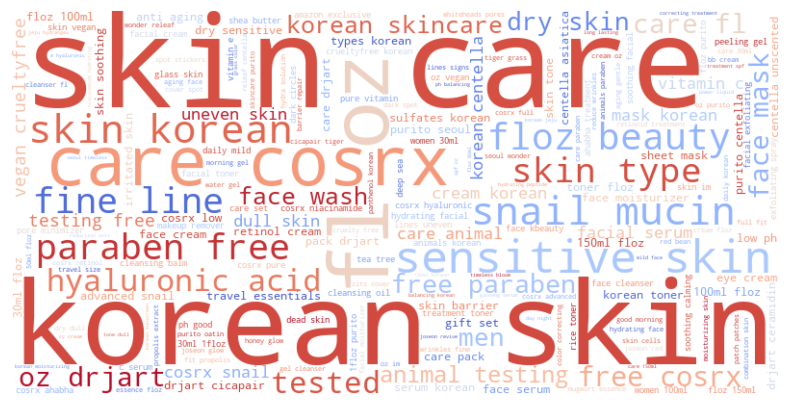

In [111]:
# 전처리된 상품 제목 (아이템 이름) 워드 클라우드
wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(amazon_df['cleaned_title'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

## ◼ Skinsort

### 시각화

In [112]:
import plotly.express as px
import plotly.io as pio

df = skinsort_copy

country_dist = df['country'].value_counts().reset_index()
country_dist.columns = ['Country', 'Count']

fig = px.pie(country_dist[:15], values='Count', names='Country', title=f"Country Distribution for Skinsort Brand Data")
fig.update_traces(hole=.3)
# imgname = "skinsort_country_distribution.png"
# fig.write_image(DATA_PATH+imgname)
fig.show()

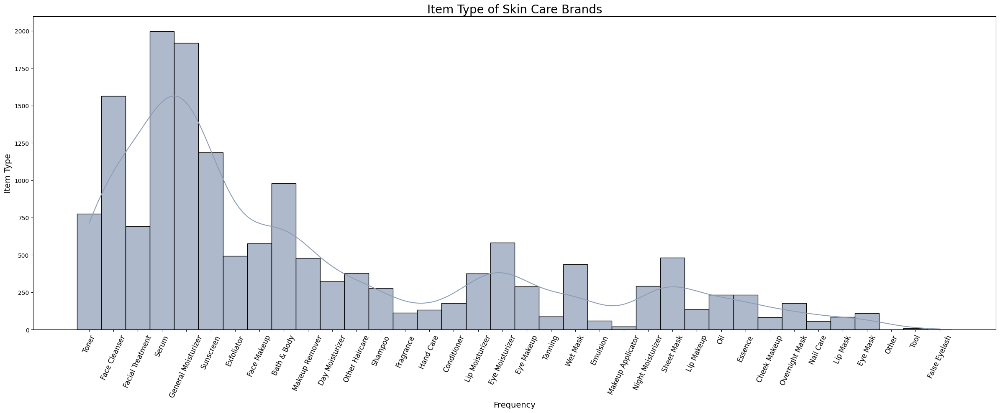

In [113]:
# 카테고리 분포
plt.figure(figsize=(24,10))
sns.histplot(data=skinsort_copy['type'], bins=31, alpha=0.7, color='#8C9DB7', kde=True)
plt.title('Item Type of Skin Care Brands', fontsize=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Item Type', fontsize=14)

plt.tight_layout()
plt.show()

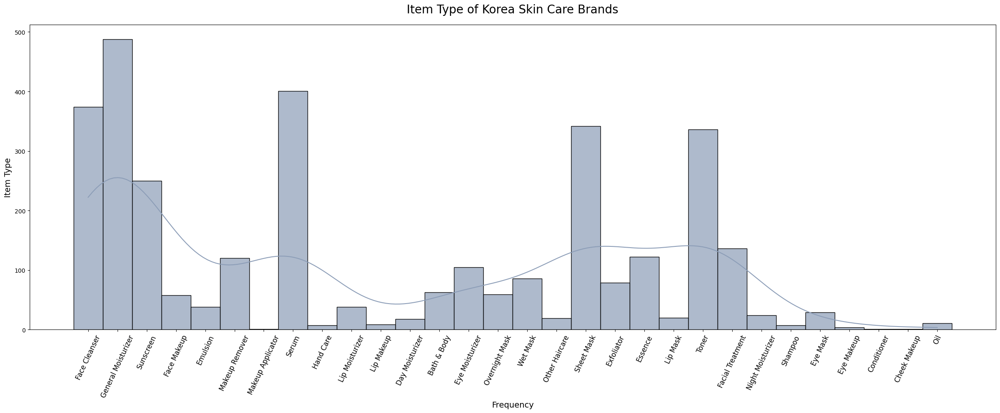

In [114]:
# 한국 스킨케어 브랜드들의 제품 타입 분포
# skincare 데이터셋 활용용
query_cond = "country == 'South Korea'"
k_skin_brand = skinsort_copy.query(query_cond).reset_index()
k_skin_brand.drop(columns='index', inplace=True)
k_skin_brand.head(2)

plt.figure(figsize=(24,10))

sns.histplot(data=k_skin_brand['type'], bins=31, alpha=0.7, color='#8C9DB7', kde=True)
plt.title('Item Type of Korea Skin Care Brands', fontsize=20, pad=20)

plt.xticks(rotation=65, fontsize=12)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Item Type', fontsize=14)

plt.tight_layout()
plt.show()

> Skinsort 한국 스킨케어 브랜드의 제품 유형 분포
- 일반적으로 알고 있는 것과 비슷함. general moisture, serum, sheet mask, toner 등 기초 제품들과 마스크팩이 많음 !

In [115]:
k_skin_brand.head(2)

,level_0,brand,name,type,country,ingridients,afterUse,cleaned_ingridients,cleaned_afterUse,tokenized_ingridients,tokenized_afterUse,stemmed_ingridients,stemmed_afterUse,stpw_processed_ingridients,stpw_processed_afterUse
0,4,COSRX,Low pH Good Morning Gel Cleanser,Face Cleanser,South Korea,"Water,Cocamidopropyl Betaine,Sodium Lauroyl Me...","Good For Oily Skin,Reduces Irritation,Reduces ...",watercocamidopropyl betainesodium lauroyl meth...,good for oily skinreduces irritationreduces la...,"[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oily, skinreduces, irritationreduc...","[watercocamidopropyl, betainesodium, lauroyl, ...","[good, for, oili, skinreduc, irritationreduc, ...","[watercocamidopropyl, betainesodium, lauroyl, ...","[good, oily, skinreduces, irritationreduces, l..."
1,7,COSRX,Advanced Snail 92 All In One Cream,General Moisturizer,South Korea,"Snail Secretion Filtrate,Betaine,Caprylic/Capr...","Redness Reducing,Reduces Irritation,May Worsen...",snail secretion filtratebetainecapryliccapric ...,redness reducingreduces irritationmay worsen o...,"[snail, secretion, filtratebetainecapryliccapr...","[redness, reducingreduces, irritationmay, wors...","[snail, secret, filtratebetainecapryliccapr, t...","[red, reducingreduc, irritationmay, worsen, oi...","[snail, secretion, filtratebetainecapryliccapr...","[redness, reducingreduces, irritationmay, wors..."


### 워드클라우드

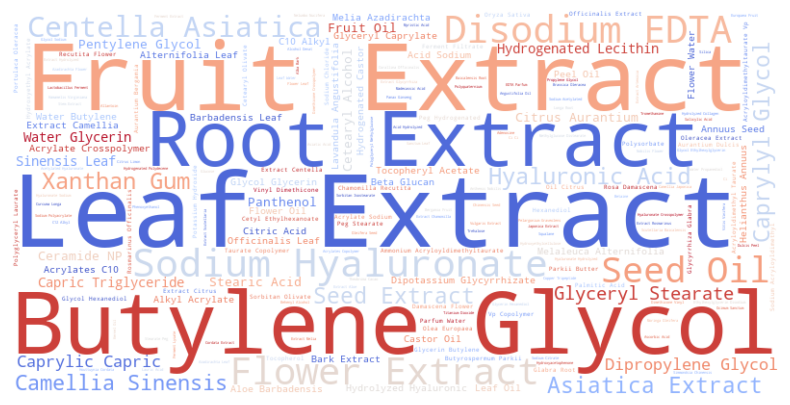

In [116]:
# 한국 스킨케어 브랜드 성분
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(k_skin_brand['ingridients'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

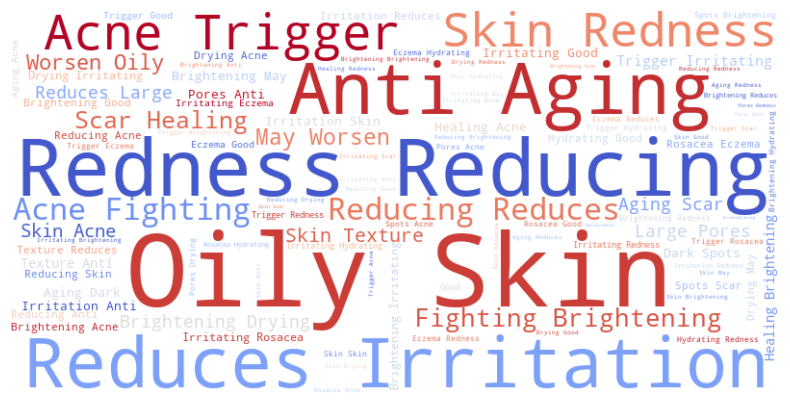

In [117]:
# 한국 스킨케어 브랜드 - 사용후
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(k_skin_brand['afterUse'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Review")
plt.show()

> 사용 후 반응
- 피부 타입 개인 차에 따른 반응들이 여기도 많음. 더 기름이 심해졌다, 건조하다 등
- 간지러움, 붉어짐 등 -> 개인적인 생각이지만 너무 특이한 성분? 약초나 시카 성분 등 자연성분을 강조한다고 너무 특이한 게 들어가면 개인 차를 많이 타는 것 같음

# PART 3: Data Analysis

## ◼ Amazon

### Sentiment Analysis

In [118]:
k_skin_brand.dropna(subset=['ingridients'], inplace=True)
k_skin_brand['splitted_ingridients'] = k_skin_brand['ingridients'].apply(lambda x: str(x).split(',') if pd.notna(x) else [])

print(k_skin_brand['splitted_ingridients'].head())

k_skin_brand.dropna(subset=['afterUse'], inplace=True)
k_skin_brand['splitted_afterUse'] = k_skin_brand['afterUse'].apply(lambda x: str(x).split(',') if pd.notna(x) else [])

print(k_skin_brand['splitted_afterUse'].head())

0    [Water, Cocamidopropyl Betaine, Sodium Lauroyl...
1    [Snail Secretion Filtrate, Betaine, Caprylic/C...
2    [Water, Oryza Sativa Extract 30%, Dibutyl Adip...
3    [Water, Octocrylene, Citrullus Lanatus Fruit E...
4    [Water, Cyclopentasiloxane, Ethylhexyl Methoxy...
Name: splitted_ingridients, dtype: object
0    [Good For Oily Skin, Reduces Irritation, Reduc...
1    [Redness Reducing, Reduces Irritation, May Wor...
2    [Good For Oily Skin, Redness Reducing, Acne Fi...
3    [Drying, May Worsen Oily Skin, Acne Trigger, I...
4    [Good For Oily Skin, Redness Reducing, Brighte...
Name: splitted_afterUse, dtype: object


In [119]:
# from sklearn.feature_extraction.text import TfidfVectorizer

# # Ensure columns are lists of strings
# column1_texts = [' '.join(ingredients) for ingredients in k_skin_brand.splitted_ingridients]
# column2_texts = [' '.join(after_use) for after_use in k_skin_brand.splitted_afterUse]

# # Apply TfidfVectorizer
# vectorizer = TfidfVectorizer()
# column1_vectors = vectorizer.fit_transform(column1_texts)
# column2_vectors = vectorizer.transform(column2_texts)

# import numpy as np
# from scipy.stats import pearsonr

# correlations = []
# for i in range(column1_vectors.shape[1]):
#     try:
#         # Calculate Pearson correlation for each feature
#         corr, _ = pearsonr(column1_vectors[:, i].toarray().flatten(), 
#                            column2_vectors[:, i].toarray().flatten())
#         correlations.append(corr)
#     except Exception as e:
#         # Handle cases where Pearson correlation fails
#         correlations.append(np.nan)

# # Visualization
# import matplotlib.pyplot as plt
# import seaborn as sns

# plt.figure(figsize=(12, 8))
# sns.heatmap(np.array(correlations).reshape(-1, 1), 
#             cmap='coolwarm', center=0, cbar_kws={'label': 'Correlation'})
# plt.title('Element-wise Correlation between Two Text Columns')
# plt.show()

In [120]:
# 감성 분석을 위한 코드
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Create an instance of SentimentIntensityAnalyzer, which is part of the VADER sentiment analysis tool.
analyzer = SentimentIntensityAnalyzer()

# Function to apply VADER sentiment analysis to each review.
# The function takes in a 'review' (text) and returns the polarity scores, which include
# 'compound', 'positive', 'negative', and 'neutral' sentiment values.
def get_sentiment(review):
    return analyzer.polarity_scores(review)

# Apply the 'get_sentiment' function to each entry in the 'Cleaned_Review' column.
# Store the resulting sentiment scores (dictionary) in a new column 'vader_scores'.
amazon_df['cleaned_review'] = amazon_df['cleaned_review'].astype(str)
amazon_df['vader_scores'] = amazon_df['cleaned_review'].apply(get_sentiment)

k_skin_brand['afterUse'] = k_skin_brand['afterUse'].astype(str)
k_skin_brand['vader_scores'] = k_skin_brand['afterUse'].apply(get_sentiment)

# Extract the 'compound' score from the 'vader_scores' dictionary for each review.
# The 'compound' score is a normalized score ranging from -1 (most negative) to +1 (most positive),
# summarizing the overall sentiment of the text.
amazon_df['compound'] = amazon_df['vader_scores'].apply(lambda score_dict: score_dict['compound'])
k_skin_brand['compound'] = k_skin_brand['vader_scores'].apply(lambda score_dict: score_dict['compound'])

# Function to classify the sentiment based on the 'compound' score.
# Scores >= 0.05 are classified as 'Positive', <= -0.05 as 'Negative', and anything in between as 'Neutral'.
def classify_sentiment(compound_score):
    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply the 'classify_sentiment' function to the 'compound' score to get the overall sentiment
# classification (Positive, Negative, or Neutral) for each review.
amazon_df['sentiment'] = amazon_df['compound'].apply(classify_sentiment)
k_skin_brand['sentiment'] = k_skin_brand['compound'].apply(classify_sentiment)

# Display the first few rows of the DataFrame, showing the cleaned review text,
# the 'compound' sentiment score, and the classified 'sentiment'.
print(amazon_df[['cleaned_review', 'compound', 'sentiment']].head(2))

                                      cleaned_review  compound sentiment
0  not as good as people hype it up to be i’ll us...   -0.5428  Negative
1  had to use this for a bit to give it a review ...    0.5423  Positive


In [121]:
# 2. 긍정적/부정적 리뷰별 가격과 평균 평점
amazon_df_copy2 = amazon_df.copy()

amazon_df_copy_coef = amazon_df_copy2.groupby('total_star_mean')['review_content'].count().reset_index()

customer_segments = amazon_df_copy2.groupby('sentiment')[['price', 'total_star_mean']].mean().round(2)

print(customer_segments)

           price  total_star_mean
sentiment                        
Negative   19.47             4.42
Neutral    19.29             4.45
Positive   20.84             4.45


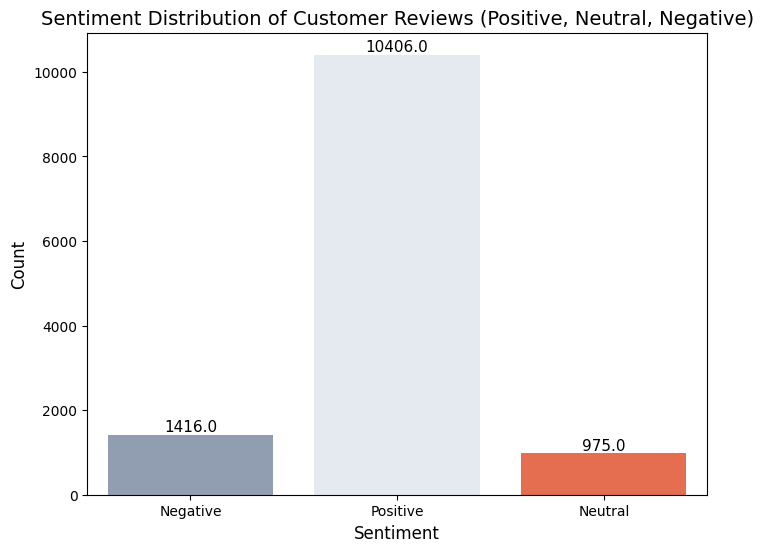

In [122]:
# 아마존
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df, x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

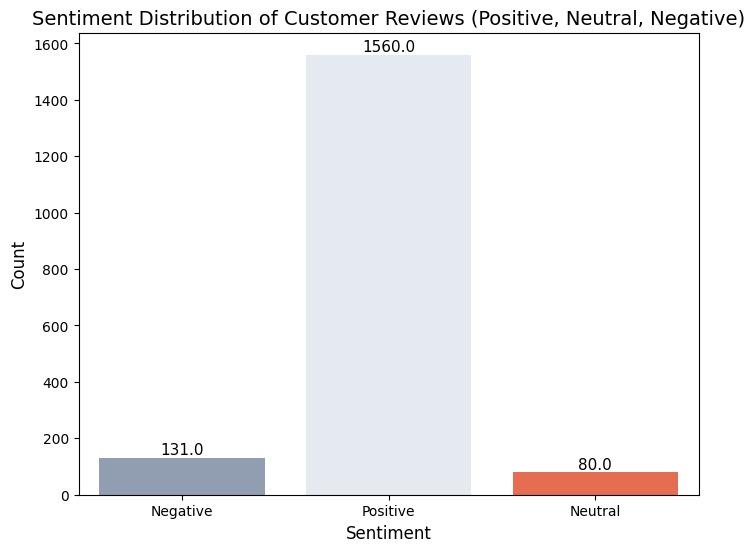

In [123]:
# 아마존 # Dr.Jart+
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=='Dr.Jart+'], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

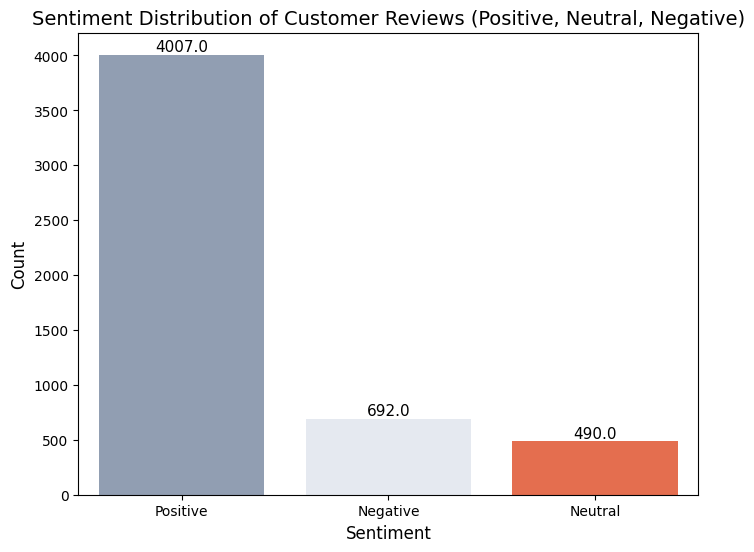

In [124]:
# 아마존 # Cosrx
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=='COSRX'], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

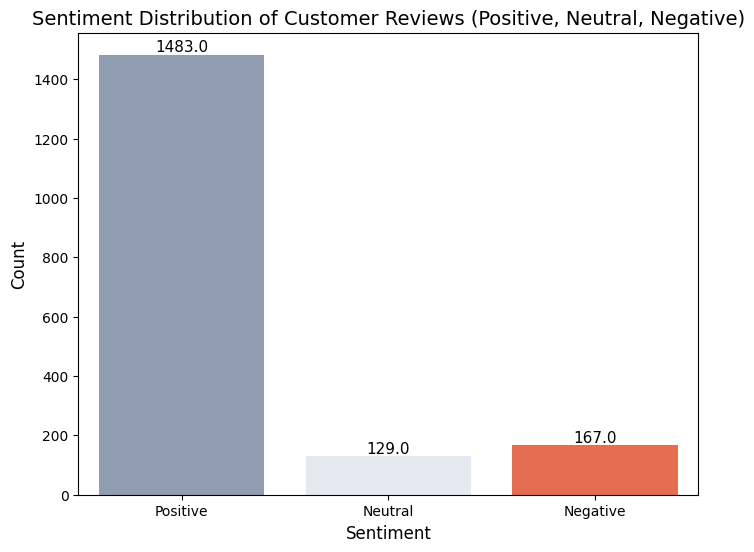

In [125]:
# 아마존 # I'm from
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="I'm from"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

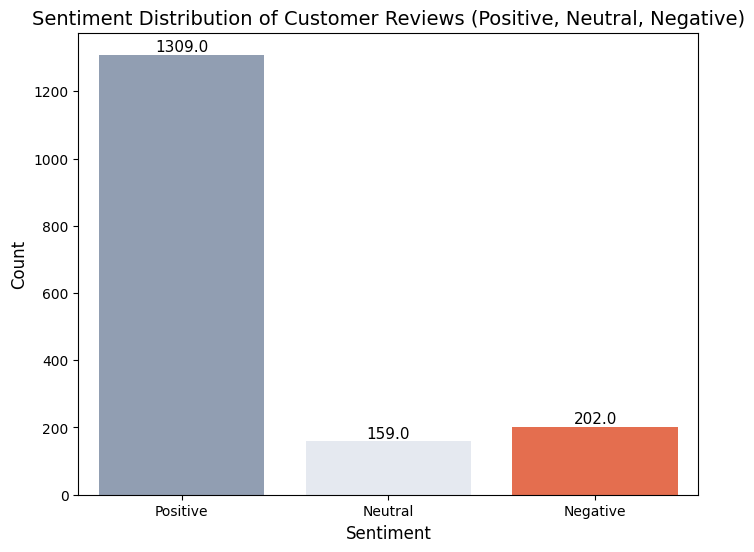

In [126]:
# 아마존 # Beauty of Joseon
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="Beauty of Joseon"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

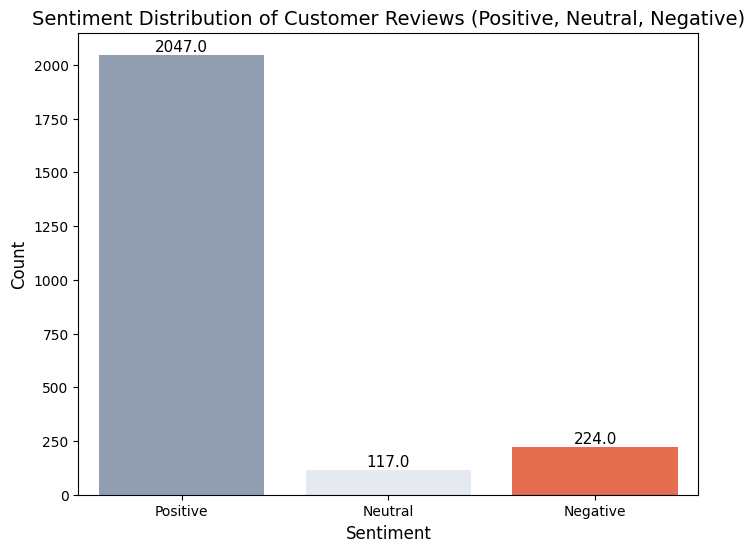

In [127]:
# 아마존 # PURITO
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=amazon_df[amazon_df['brand']=="PURITO"], x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

### 감성분석 후 워드클라우드

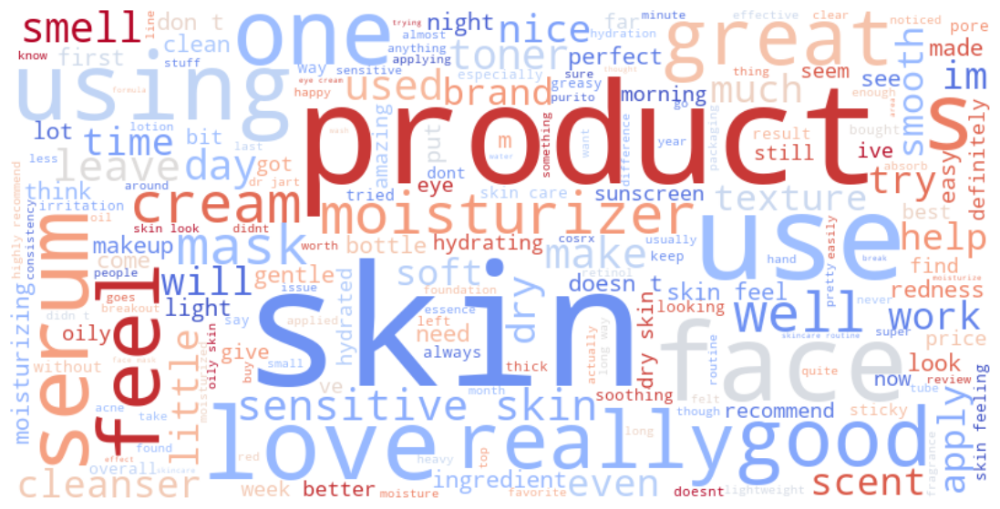

In [128]:
# 긍정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

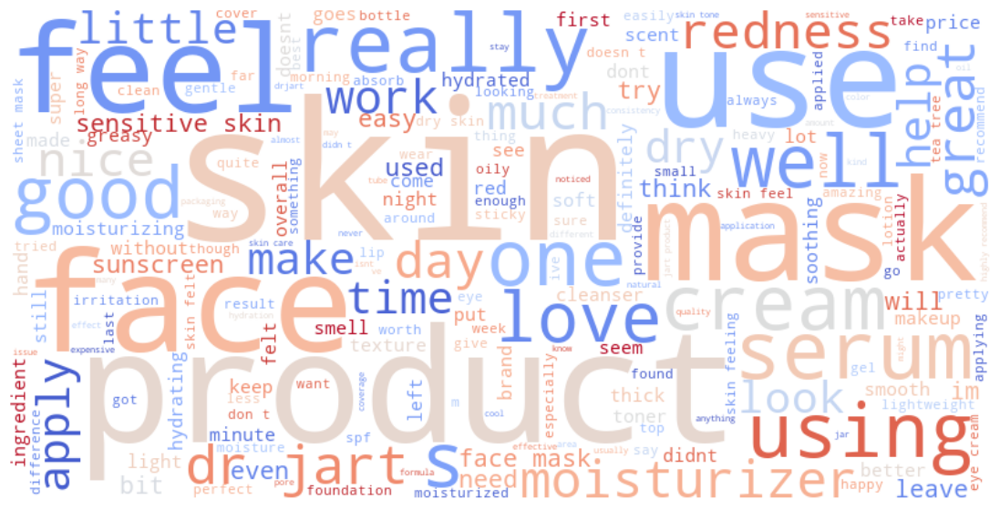

In [129]:
# 긍정적 리뷰 내용 - 워드 클라우드 # Dr.Jart+
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="Dr.Jart+"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

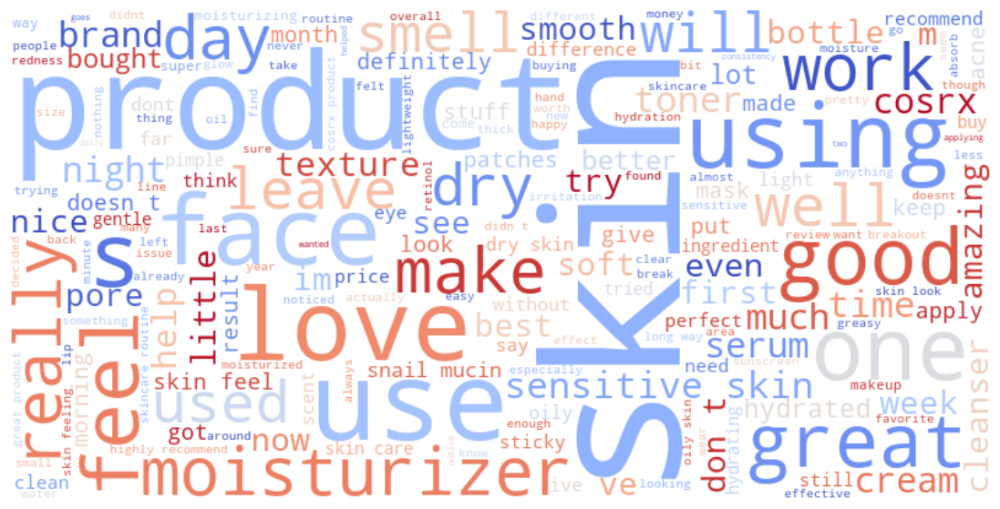

In [130]:
# 긍정적 리뷰 내용 - 워드 클라우드 # COSRX
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="COSRX"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

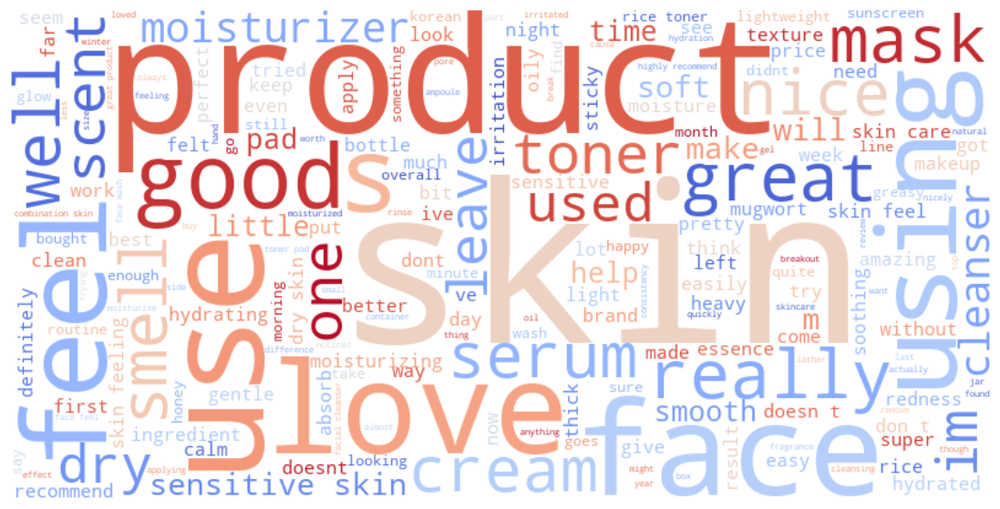

In [131]:
# 긍정적 리뷰 내용 - 워드 클라우드 # I'm from   
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="I'm from"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

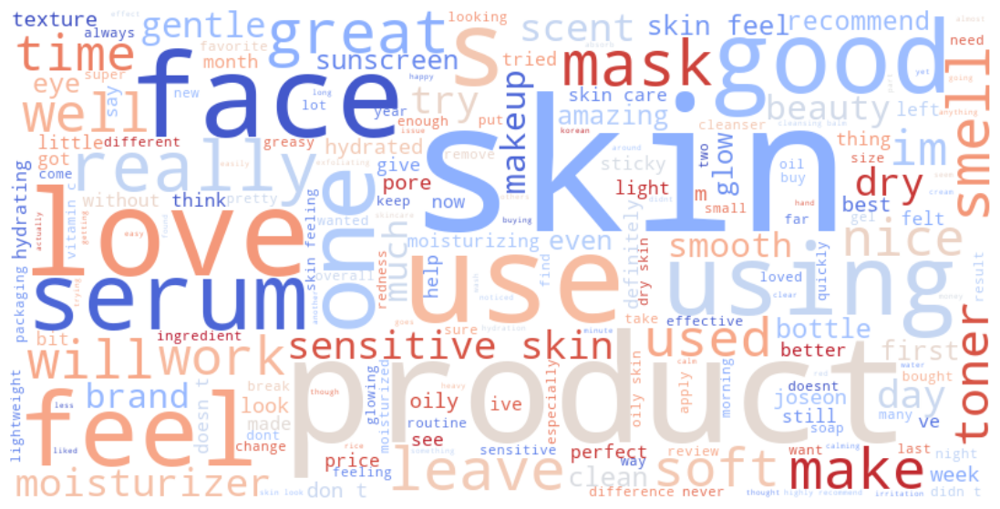

In [132]:
# 긍정적 리뷰 내용 - 워드 클라우드 # Beauty of Joseon
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="Beauty of Joseon"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

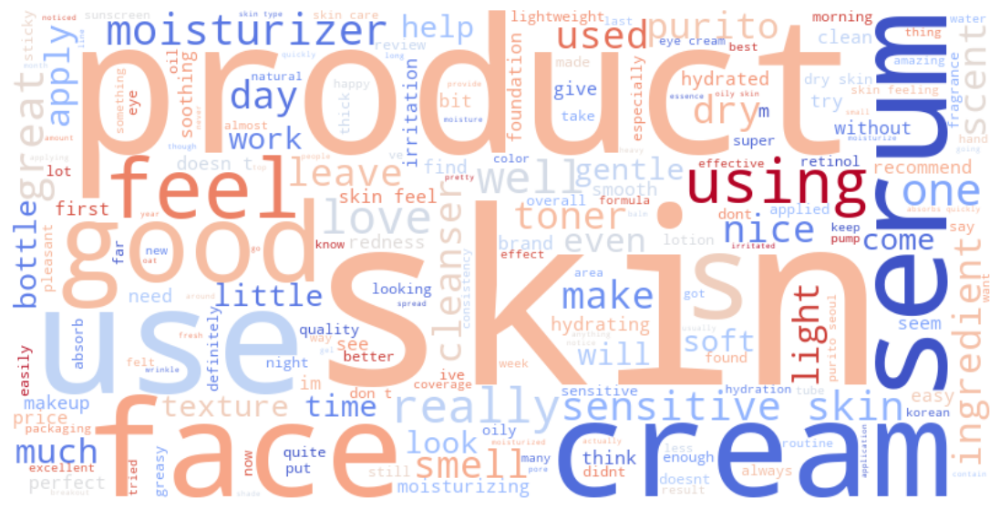

In [133]:
# 긍정적 리뷰 내용 - 워드 클라우드 # PURITO
query_cond = 'sentiment == "Positive"'
pos_df = amazon_df[amazon_df['brand']=="PURITO"].query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(pos_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

> 긍정 리뷰
- 수분 : hydration, hydrated, moisturing, moisture 
- 카테고리 : skin-care, make-up (카테고리인지, 메이크업할 때 잘 먹는다는 건지는 원본을 봐야알듯)
            skin, skin-care, skincare routine 등이 많음
- 아이템 : oil, serum, cleanser, toner, cream
- 시간 : morning, night ..
    
    - 스킨케어 루틴 중에 일상적으로 이용, 수분감 등 기능성에 긍정적 반응이 주로 (현재 샘플 데이터 기준)
    현재, K-beauty 의 경우 Skin care 쪽으로 미국에서 반응이 좋은데 이 부분과 일치하는 리뷰 내용임.

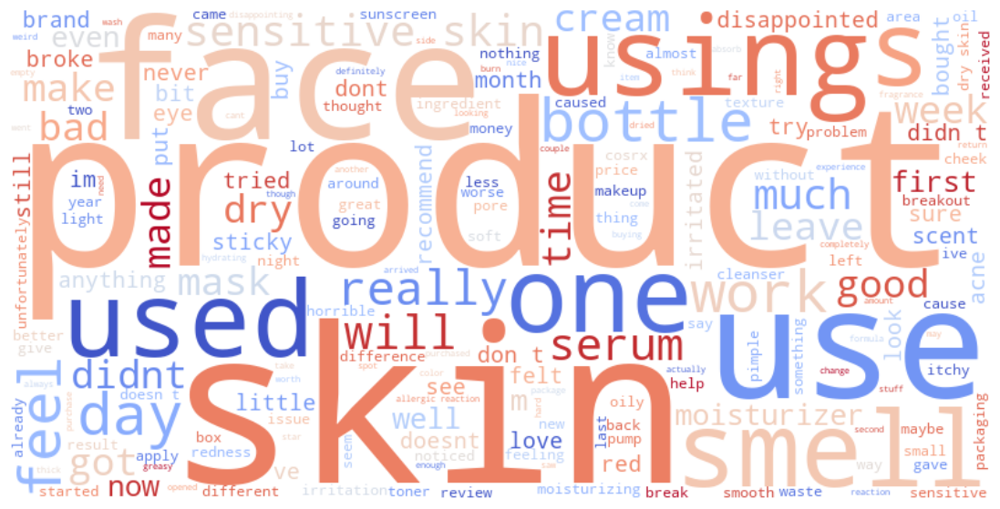

In [134]:
# 부정정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df.query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

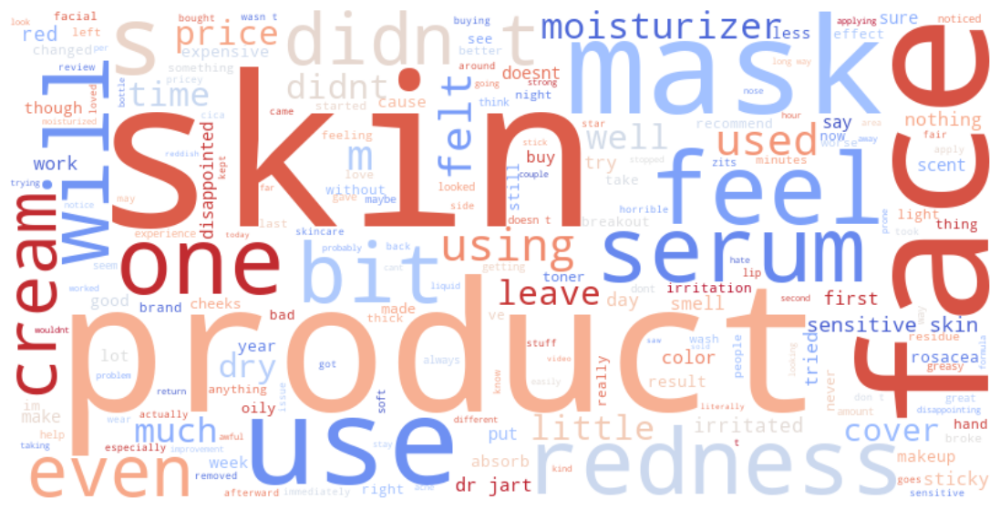

In [135]:
# 부정정적 리뷰 내용 - 워드 클라우드 # Dr.Jart+
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="Dr.Jart+"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

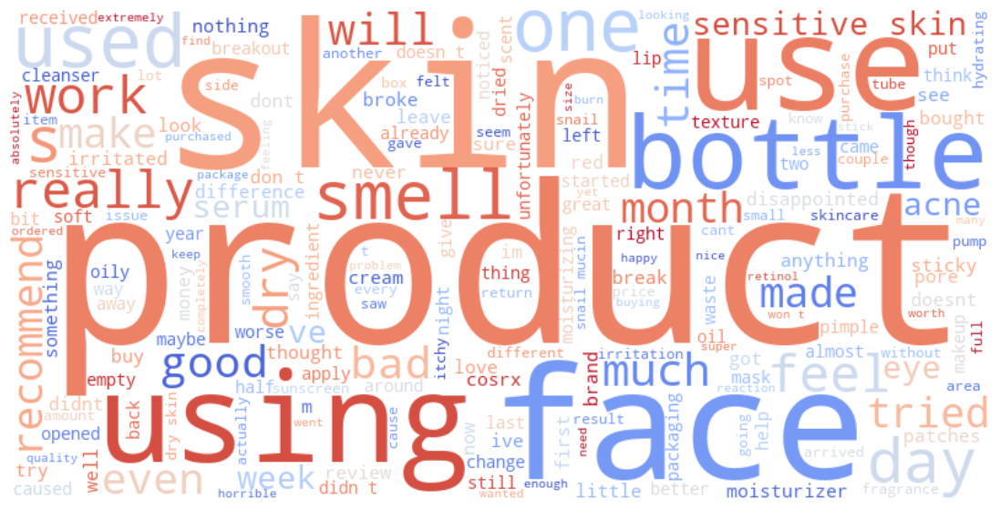

In [136]:
# 부정정적 리뷰 내용 - 워드 클라우드 # COSRX
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="COSRX"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

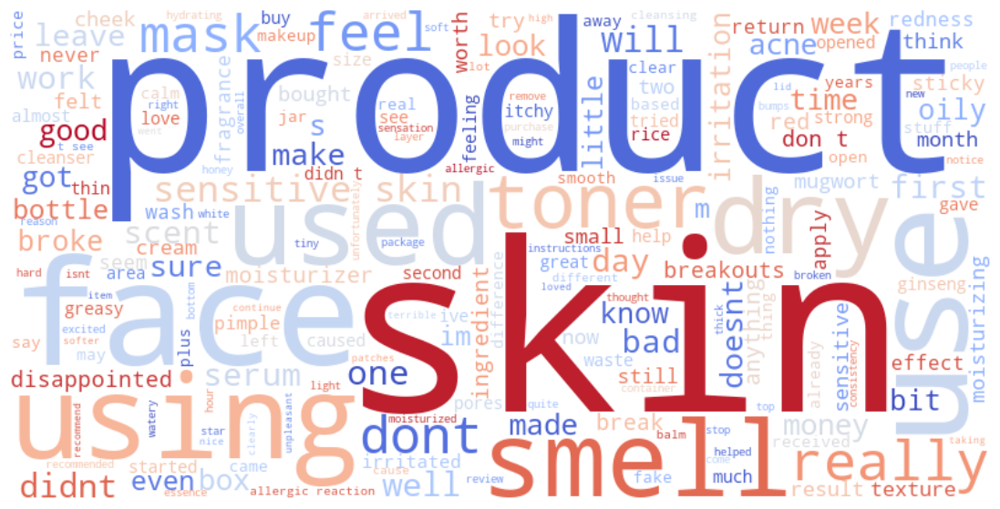

In [137]:
# 부정정적 리뷰 내용 - 워드 클라우드 # I'm from
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="I'm from"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

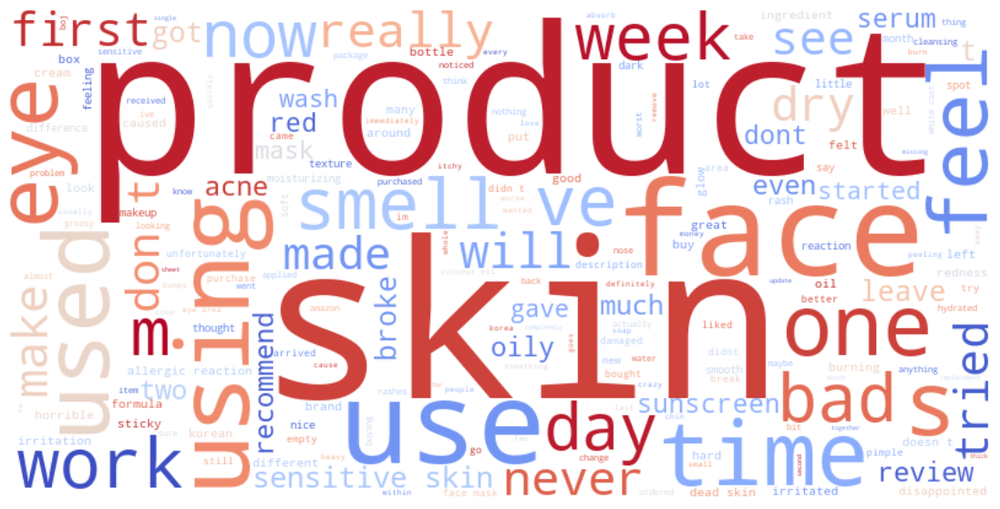

In [138]:
# 부정정적 리뷰 내용 - 워드 클라우드 # Beauty of Joseon
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="Beauty of Joseon"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

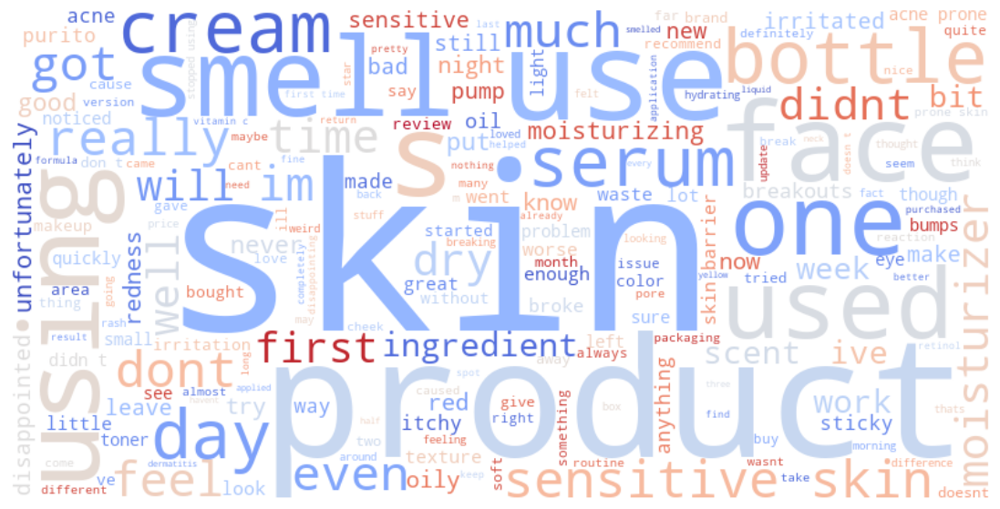

In [139]:
# 부정정적 리뷰 내용 - 워드 클라우드 # PURITO
query_cond = 'sentiment == "Negative"'
neg_df = amazon_df[amazon_df['brand']=="PURITO"].query(query_cond)
neg_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(neg_df['cleaned_review'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

> 부정 리뷰
- dry <-> sticky, expected (기대치에 떨어진듯), money (돈이 아깝다는 건지, 비싸다는 건지 리뷰 원본 봐야됨), waste, damaged (제품 패키지가 손상? 본인의 피부가 손상?), horrible..

    - 건조하다 <-> 끈적거린다 : 이거는 고객 피부 타입별로 맞춤형 필요해보임
        waste, damaged, horrible 등 최악의 평가를 받은 리뷰는 내용 확인해볼 필요 있어보임.

## ■ Skinsort

### Sentiment Analysis

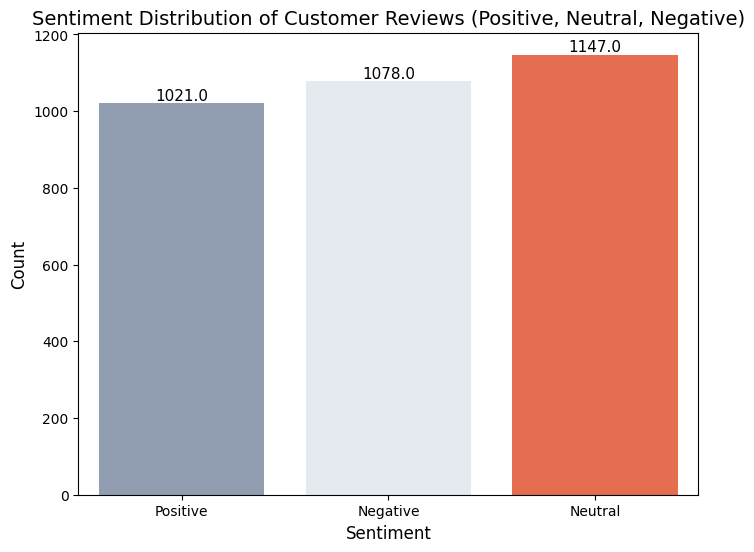

In [140]:
# 스킨쏘트
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=k_skin_brand, x='sentiment', palette=skin_palette)

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

### 감성분석 후 워드클라우드

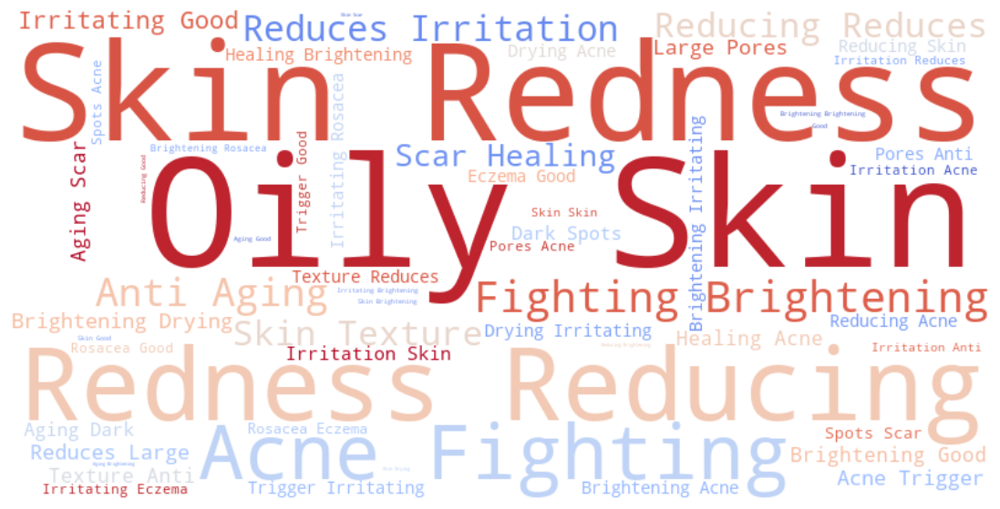

In [141]:
# 긍정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Positive"'
pos_df = k_skin_brand.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['afterUse'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

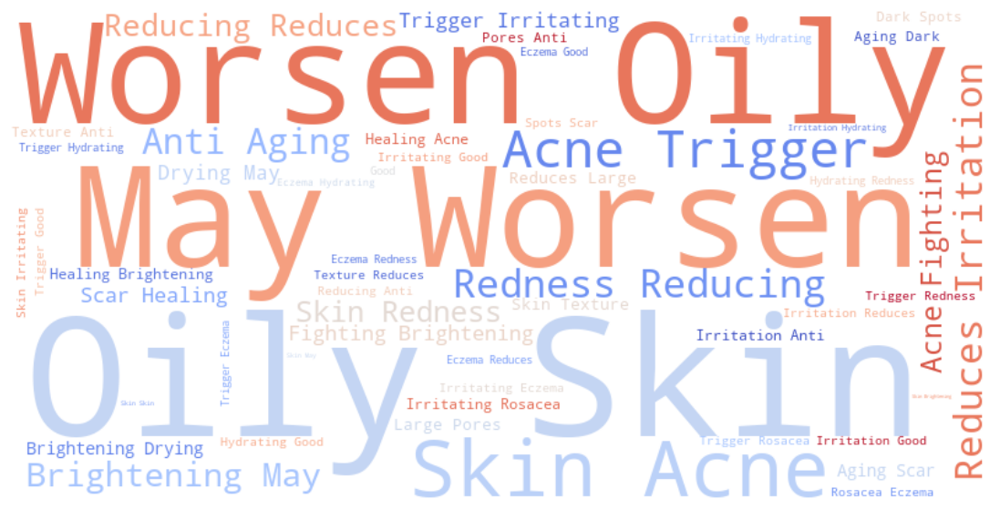

In [142]:
# 부정적 리뷰 내용 - 워드 클라우드
query_cond = 'sentiment == "Negative"'
pos_df = k_skin_brand.query(query_cond)
pos_df.reset_index(drop=True, inplace=True)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(pos_df['afterUse'].dropna()))
plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Item Title")
plt.show()

## Topic Modeling

https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

> 토픽 모델링을 저희가 가진 컬럼 별로 더 상세하게 진행해해보면, 의미있는 주제 별로 정리해볼 수 있을 것 같습니다.
- 현재 아래 코드 적용된 예시) 아마존 데이터의 리뷰 데이터
- (추가 아이디어) 
 - skinsort 에 afterUse 컬럼 (사용효과) : 수분있는, 보습잘되는, 자극없는, 트러블안생기는 .. 등
 - 아마존이나 스킨쏘트 데이터에 성분 컬럼: 성분들 토픽 별로 묶음
 - 피부 타입에 대한 게 있으면 또 좋을 것 같음: ?

In [143]:
# 내용 추가된 부분!
# 어떻게 활용할 수 있을지 생각해보기!

In [144]:
# Prepare data for LDA Analysis
import gensim
from gensim.utils import simple_preprocess

lda_stopwords = [
    "use", "using","locals", "cf", "fb", "ba" ,"well","like","feel"
    "best", "top", "favorite", "amazing", "perfect",
    "good", "bad", "great", "recommend", "use", "review", "love","brand", "brands", "item", "items", "category", "categories", "line", "lines","formula", "formulas", "ingredient", "ingredients", "collection", "collections",
"worked", "works", "doesn't", "didn't", "okay", "fine", "worth", "worthless","amazing", "awesome", "perfect", "nice", "okay", "awful", "terrible", "horrible","face", "feel","really","stuff","skin","used","time", "dont","makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never","bought", "cosrx","always","less",
"time","without","absolutely","might","maybe","sure","think","though", "getting","want","result","know", "especially","dr jart","feel","didnt","dosent","purchase","definitely","bottle","im","thing","wash","smell","started","need","fragrance","mask","type","facial","another","noticed","actually", "people","money","got","box","every","another","found","jart","wear"
"set", "sets", "value", "values", "pack", "packs","new", "latest", "exclusive", "limited", "special", "natural", "organic","premium", "luxury", "high-end", "affordable", "cheap", "popular", "trending","quality", "safe", "effective", "innovation", "innovative",
]

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','object','generator','genexpr'])
stop_words.extend(kbeauty_stopwords)

# 문장 토큰화 함수 정의
def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

# 불용어 제거 함수 정의
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc))
    if word not in stop_words] for doc in texts]

# 데이터 변환    
data = amazon_df_copy.stpw_processed_review.tolist()
data_words = list(sent_to_words(data))

# 불용어 제거
data_words = remove_stopwords(data_words)

# 출력 확인
print(data_words[:1][0][:30])

['hype', 'gone', 'plan', 'ever', 'reorder']


In [145]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)]


In [146]:
# LDA model training
from pprint import pprint
# number of topics
num_topics = 5
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                        id2word=id2word,
                                        num_topics=num_topics, passes=10, iterations=200)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.020*"like" + 0.010*"sensitive" + 0.008*"would" + 0.008*"well" + '
  '0.007*"super" + 0.007*"get" + 0.006*"dry" + 0.006*"acne" + 0.006*"feels" + '
  '0.006*"also"'),
 (1,
  '0.018*"moisturizer" + 0.016*"dry" + 0.012*"like" + 0.012*"leaves" + '
  '0.012*"moisturizing" + 0.012*"sensitive" + 0.011*"oily" + 0.011*"soft" + '
  '0.011*"feels" + 0.009*"hydrating"'),
 (2,
  '0.019*"like" + 0.009*"feels" + 0.008*"see" + 0.008*"day" + 0.008*"dry" + '
  '0.008*"first" + 0.007*"night" + 0.007*"much" + 0.007*"little" + '
  '0.007*"try"'),
 (3,
  '0.017*"like" + 0.012*"well" + 0.008*"would" + 0.008*"sensitive" + '
  '0.008*"little" + 0.007*"ive" + 0.007*"scent" + 0.006*"price" + '
  '0.006*"redness" + 0.006*"cleansing"'),
 (4,
  '0.011*"like" + 0.010*"well" + 0.008*"sensitive" + 0.008*"dry" + '
  '0.007*"purito" + 0.007*"also" + 0.007*"feeling" + 0.006*"moisturizer" + '
  '0.006*"scent" + 0.006*"quickly"')]


In [147]:
import os
import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))

# Create directory if it does not exist
if not os.path.exists('./results'):
    os.makedirs('./results')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.060896  0.011518       1        1  27.168603
3     -0.024443 -0.040260       2        1  22.345298
4      0.031922 -0.049001       3        1  21.119361
0     -0.049718  0.044072       4        1  15.559010
1      0.103135  0.033672       5        1  13.807728, topic_info=                 Term         Freq        Total Category  logprob  loglift
226       moisturizer  1445.000000  1445.000000  Default  30.0000  30.0000
737            leaves   858.000000   858.000000  Default  29.0000  29.0000
9        moisturizing   845.000000   845.000000  Default  28.0000  28.0000
1246        hydrating   681.000000   681.000000  Default  27.0000  27.0000
340              oily   958.000000   958.000000  Default  26.0000  26.0000
975            lotion   390.000000   390.000000  Default  25.0000  25.0000
33                dry  1991.000000  1991.000000  Default  24.0000  24.0000
7279           purito   492.000000   492.000000  Default  23.0000  23.0000
747           absorbs   582.000000   582.000000  Default  22.0000  22.0000
861              soft  1106.000000  1106.000000  Default  21.0000  21.0000
325           quickly   659.000000   659.000000  Default  20.0000  20.0000
48          sensitive  1820.000000  1820.000000  Default  19.0000  19.0000
711         cleansing   414.000000   414.000000  Default  18.0000  18.0000
198           feeling  1083.000000  1083.000000  Default  17.0000  17.0000
160            sticky   722.000000   722.000000  Default  16.0000  16.0000
476       lightweight   484.000000   484.000000  Default  15.0000  15.0000
557               see   829.000000   829.000000  Default  14.0000  14.0000
102              well  2032.000000  2032.000000  Default  13.0000  13.0000
63             greasy   580.000000   580.000000  Default  12.0000  12.0000
313             super   691.000000   691.000000  Default  11.0000  11.0000
1841          extract   244.000000   244.000000  Default  10.0000  10.0000
140             feels  1660.000000  1660.000000  Default   9.0000   9.0000
157             scent  1127.000000  1127.000000  Default   8.0000   8.0000
145             heavy   375.000000   375.000000  Default   7.0000   7.0000
1190             lips   208.000000   208.000000  Default   6.0000   6.0000
23              light   923.000000   923.000000  Default   5.0000   5.0000
398            doesnt   883.000000   883.000000  Default   4.0000   4.0000
550          hydrated   780.000000   780.000000  Default   3.0000   3.0000
1384           winter   271.000000   271.000000  Default   2.0000   2.0000
65               like  3905.000000  3905.000000  Default   1.0000   1.0000
2438             clay    43.252094    45.545582   Topic1  -7.3283   1.2514
3533          chapped    31.507606    33.913192   Topic1  -7.6451   1.2295
1190             lips   193.070545   208.859283   Topic1  -5.8323   1.2245
1535              lip   119.988697   132.388174   Topic1  -6.3080   1.2048
2563            glows    19.258571    21.267413   Topic1  -8.1374   1.2039
182         undertone     9.616261    10.646168   Topic1  -8.8319   1.2014
1348       developing     6.906789     7.739824   Topic1  -9.1629   1.1892
2465         flexible     7.736134     8.691507   Topic1  -9.0495   1.1867
1842           bummed    10.345326    11.628399   Topic1  -8.7588   1.1862
3185   microparticles     6.001573     6.766873   Topic1  -9.3033   1.1831
2442              mud    15.415379    17.403876   Topic1  -8.3600   1.1818
6761           ampule     5.956730     6.765662   Topic1  -9.3108   1.1758
3531            habit     5.908432     6.766138   Topic1  -9.3190   1.1676
5374            purge    13.470228    15.456867   Topic1  -8.4949   1.1655
3526            bleed     5.038624     5.800560   Topic1  -9.4782   1.1623
3549          changer    23.493418    27.059629   Topic1  -7.9386   1.1618
3743            faded     8.378122     9.651307   Topi

## 군집분석

### ◼ Skinsort

#### K-means Clustering

In [148]:
cond = '''brand=="I'm from" or brand=="Beauty of Joseon" or brand=="PURITO"'''
clustering_df = amazon_df.query(cond)

In [149]:
skinsort_clustering = skinsort_copy.query(cond)
skinsort_clustering.brand.value_counts()

brand
PURITO              46
I'm from            32
Beauty of Joseon    22
Name: count, dtype: int64

In [150]:
km_df = pd.merge(clustering_df, skinsort_clustering, how='inner', on='brand')
km_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203516 entries, 0 to 203515
Data columns (total 65 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   ASIN                             203516 non-null  object        
 1   title                            203516 non-null  object        
 2   order                            203516 non-null  int64         
 3   Amazon_Category                  203516 non-null  object        
 4   brand                            203516 non-null  object        
 5   price                            192748 non-null  float64       
 6   global_rating_count              203516 non-null  Int64         
 7   Special_Feature                  39848 non-null   object        
 8   total_star_mean                  203516 non-null  float64       
 9   Benefits                         0 non-null       object        
 10  Description                      0 non-null 

In [151]:
# 클러스터링 할 컬럼 지정
feature_names=['price','cleaned_title','type','ingridients', 'cleaned_ingridients','afterUse','cleaned_review','cleaned_afterUse']
base_df = pd.DataFrame(km_df, columns=feature_names)

In [152]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

df = base_df

# TF-IDF 벡터화 객체 생성
tfidf_vectorizer = TfidfVectorizer(
    max_features=10,  # 각 컬럼에서 최대 10개의 중요한 단어 선택
    stop_words="english",  # 불용어 제거
    ngram_range=(1, 2)  # 1~2그램 사용
)

# 컬럼별 TF-IDF 변환
tfidf_results = {}
for column in feature_names[1:]:
    # NaN 제거 후 TF-IDF 적용
    tfidf_matrix = tfidf_vectorizer.fit_transform(df[column].dropna())
    
    # TF-IDF 결과를 데이터프레임으로 저장
    tfidf_results[column] = pd.DataFrame(
        tfidf_matrix.toarray(),
        columns=[f"{column}_{feature}" for feature in tfidf_vectorizer.get_feature_names_out()]
    )

# 결과 병합 (컬럼 이름으로 구분된 TF-IDF 결과)
final_tfidf_df = pd.concat(tfidf_results.values(), axis=1)

In [153]:
# 표준화
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
imputed_scale_df = imputer.fit_transform(final_tfidf_df)

# 표준화 방식: standard scaler (평균0, 분산1)
std_scale_df = StandardScaler().fit_transform(imputed_scale_df)

In [154]:
# 주성분 개수를 판단하기 위한 pca임의 시행 
pca = PCA(n_components=5)
pca.fit(std_scale_df)
# 설정한 주성분의 갯수로 전체 데이터 분산을 얼만큼 설명 가능한지 
pca.explained_variance_ratio_.sum()

0.3627518616838442

In [155]:
# pca 시행
pca_df = pca.fit_transform(std_scale_df)
pca_df = pd.DataFrame(data = pca_df, columns = ['PC1','PC2','PC3','PC4','PC5'])  

# Show the first 5 firms
pca_df.head()

,PC1,PC2,PC3,PC4,PC5
0,-3.213911,-2.805372,6.065010,-0.645019,2.031850
1,1.142200,-3.376043,0.499691,3.025787,0.102493
2,1.545818,-3.792146,2.997992,2.641512,-2.167408
3,1.339060,-3.696315,0.121866,2.393689,-2.105294
4,1.754571,-3.232958,-1.405063,3.712786,-1.969724


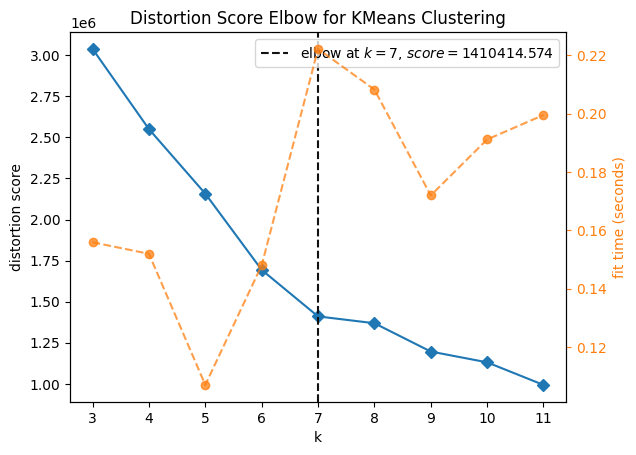

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [156]:
# 초기 k 값 참고를 위한 scree plot 을 그리고, 군집이 나뉘는 시간까지 고려한 k 값 확인 
model = KMeans()

# k 값의 범위를 조정해 줄 수 있습니다. 
visualizer = KElbowVisualizer(model, k=(3,12))

# 데이터 적용 
visualizer.fit(pca_df) 
visualizer.show()   

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/cluster/icdm.py:390: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/cluster/icdm.py:390: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/cluster/icdm.py:390: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'ne

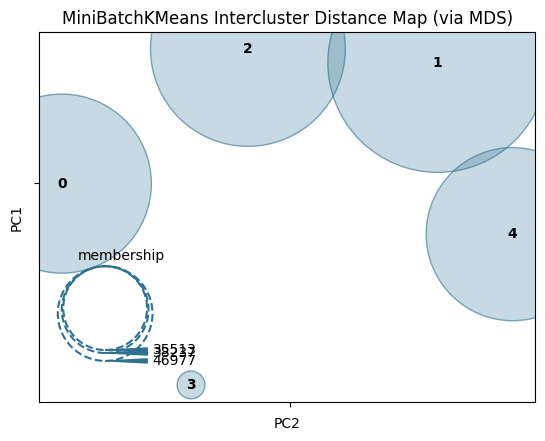

InterclusterDistance(ax=<Axes: title={'center': 'MiniBatchKMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>,
                     estimator=MiniBatchKMeans(n_clusters=5, random_state=42))

In [157]:
# 초기 k 값 참고를 위한 distance map 시각화
#그룹의 갯수를 지정해 줄 수 있습니다. 저는 5로 적어두었습니다. 
intercluster_distance(MiniBatchKMeans(5, random_state=42), pca_df)

In [158]:
#  KMEANS
# 군집개수(n_cluster)는 5,초기 중심 설정방식 랜덤,  
kmeans = KMeans(n_clusters=5, random_state=42, init='random')

# pca df 를 이용한 kmeans 알고리즘 적용
kmeans.fit(pca_df)

# 클러스터 번호 가져오기 
labels = kmeans.labels_

# 클러스터 번호가 할당된 데이터셋 생성
kmeans_df = pd.concat([pca_df, pd.DataFrame({'Cluster':labels})],axis = 1)

In [159]:
# 클러스터 번호가 할당된 데이터셋 생성
kmeans_df.groupby(['Cluster'])['PC1'].count().reset_index()

,Cluster,PC1
0,0,17059
1,1,38209
2,2,27781
3,3,33489
4,4,86978


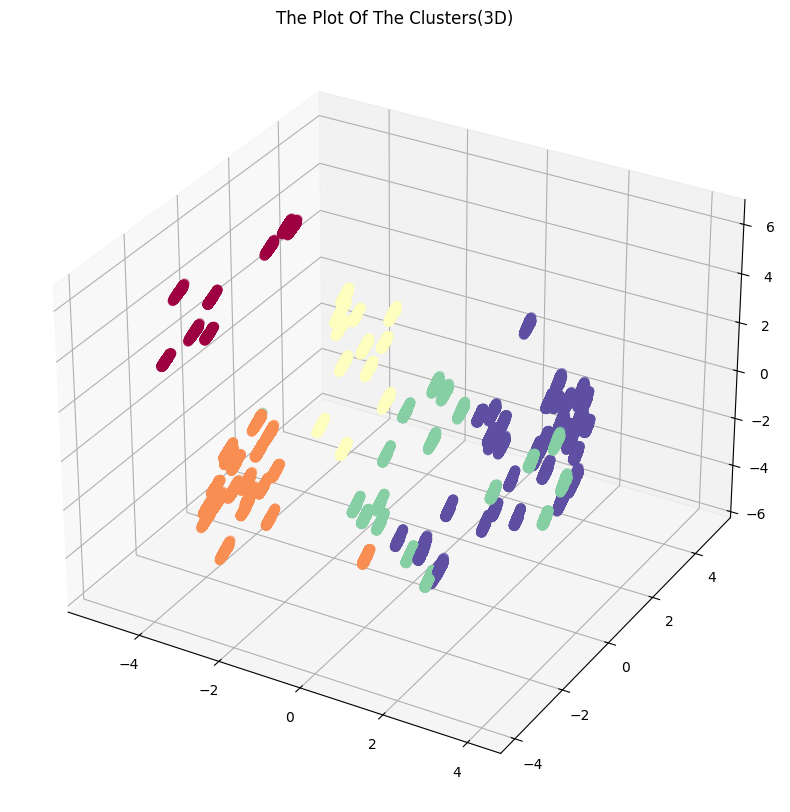

In [160]:
# 3차원으로 시각화 
x =kmeans_df["PC1"]
y =kmeans_df["PC2"]
z =kmeans_df["PC3"]

fig = plt.figure(figsize=(12,10))
ax = plt.subplot(111, projection='3d')
ax.scatter(x, y, z, s=40, c=kmeans_df["Cluster"], marker='o', alpha = 0.5, cmap = 'Spectral')
ax.set_title("The Plot Of The Clusters(3D)")

plt.show()

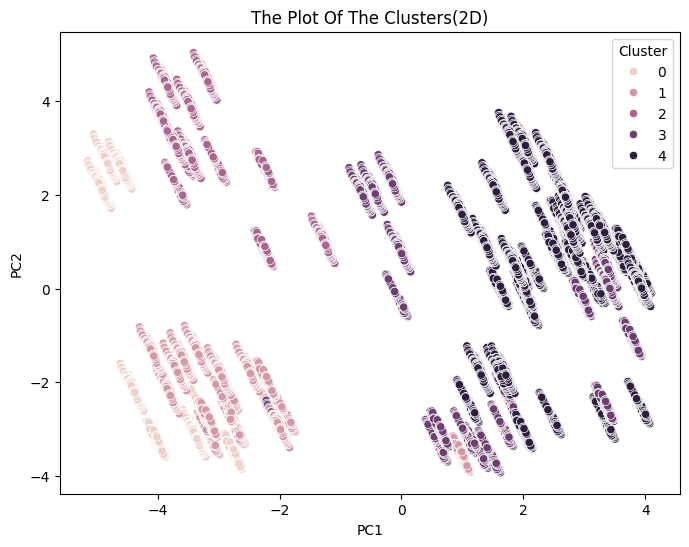

In [161]:
# 2차원으로 시각화

plt.figure(figsize=(8,6))

sns.scatterplot(data = kmeans_df, x = 'PC1', y='PC2', hue='Cluster')
plt.title('The Plot Of The Clusters(2D)')
plt.show()

# PART 5: LLM chatbot

https://teddylee777.github.io/langchain/rag-tutorial/